# Data Analysis & Visualization

## Change in Mobility during COVID19 Pandemy

### 1. Introduction

This study is conducted to investigate the change in mobility behaviour during pandemy. In the scope of this study, Mobility Report published by Google is utilized. To be able to understand the reasons behind the change in mobility, various data from multiple sources are collected.

Creating dataframes and data cleaning process is explained here: https://github.com/DrFarukAydin/data-science-portfolio/blob/main/data-collection-merging-and-cleaning/mobility-dataframe-preparation.ipynb

The same dataframe is visualized with Tableau. You can check that from the following link: https://github.com/DrFarukAydin/data-science-portfolio/blob/main/data-visualization-tableau/data-visualization-tableau.ipynb

In this work, we use the dataframe from the previous work to analyze and visualize the data. 

### 2. Importing Libraries

First, the libraries are imported.

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import urllib.request as urllib
import re
import matplotlib.dates as mdates

<br><br><br>

### 3. Data Analysis

We import the dataframe that is prepared in the following work: https://github.com/DrFarukAydin/data-science-portfolio/blob/main/data-collection-merging-and-cleaning/mobility-dataframe-preparation.ipynb

In [10]:
df = pd.read_csv("final_df.csv")

/var/folders/k5/yg__kmls5zndgtyl75h907040000gn/T/ipykernel_1155/3400699642.py:1: DtypeWarning: Columns (4,5,6,23,24,32) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("final_df.csv")


In [11]:
df.head()

,Unnamed: 0,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,...,ilce_kademe,il_skor,il_kademe,Kurşunsuz Benzin,Motorin,precipitation [mm/day],rain,MINIMUM_TRAFFIC_INDEX,MAXIMUM_TRAFFIC_INDEX,AVERAGE_TRAFFIC_INDEX
0,0,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,ChIJvRKrsd9IXj4RpwoIwFYv0zM,2020-02-15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,ChIJvRKrsd9IXj4RpwoIwFYv0zM,2020-02-16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,ChIJvRKrsd9IXj4RpwoIwFYv0zM,2020-02-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,ChIJvRKrsd9IXj4RpwoIwFYv0zM,2020-02-18,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,ChIJvRKrsd9IXj4RpwoIwFYv0zM,2020-02-19,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10430715 entries, 0 to 10430714
Data columns (total 36 columns):
 #   Column                                              Dtype  
---  ------                                              -----  
 0   Unnamed: 0                                          int64  
 1   country_region_code                                 object 
 2   country_region                                      object 
 3   sub_region_1                                        object 
 4   sub_region_2                                        object 
 5   metro_area                                          object 
 6   iso_3166_2_code                                     object 
 7   census_fips_code                                    float64
 8   place_id                                            object 
 9   date                                                object 
 10  retail_and_recreation_percent_change_from_baseline  float64
 11  grocery_and_pharmacy_percent_change

<br>It looks fine. We can just drop the id column. Then we can begin to analyze.

In [15]:
df.drop("Unnamed: 0", axis=1, inplace=True)

In [104]:
df["date"]=pd.to_datetime(df["date"])

<br><br><br>

#### 3.1. Mobility Change

<b>Source:</b> Google COVID19 Mobility Report https://www.google.com/covid19/mobility/

Google Community Mobility Reports aim to provide insights into what has changed in response to policies aimed at combating COVID-19. The data is updated daily. It contains id information (including state, city, county) with change in mobility in percent with respect to a reference time interval, 3 Jan - 6 Feb 2020. The change is divided into six categories: 
<ul>
<li>'retail_and_recreation_percent_change_from_baseline',</li>
<li>'grocery_and_pharmacy_percent_change_from_baseline',</li>
<li>'parks_percent_change_from_baseline',</li>
<li>'transit_stations_percent_change_from_baseline',</li>
<li>'workplaces_percent_change_from_baseline',</li>
<li>'residential_percent_change_from_baseline'</li>
</ul>

<br>

##### 3.1.1. Correlation Matrix

Since the data is checked in the previous work, we can start with a simple correlation analysis.

<AxesSubplot:>

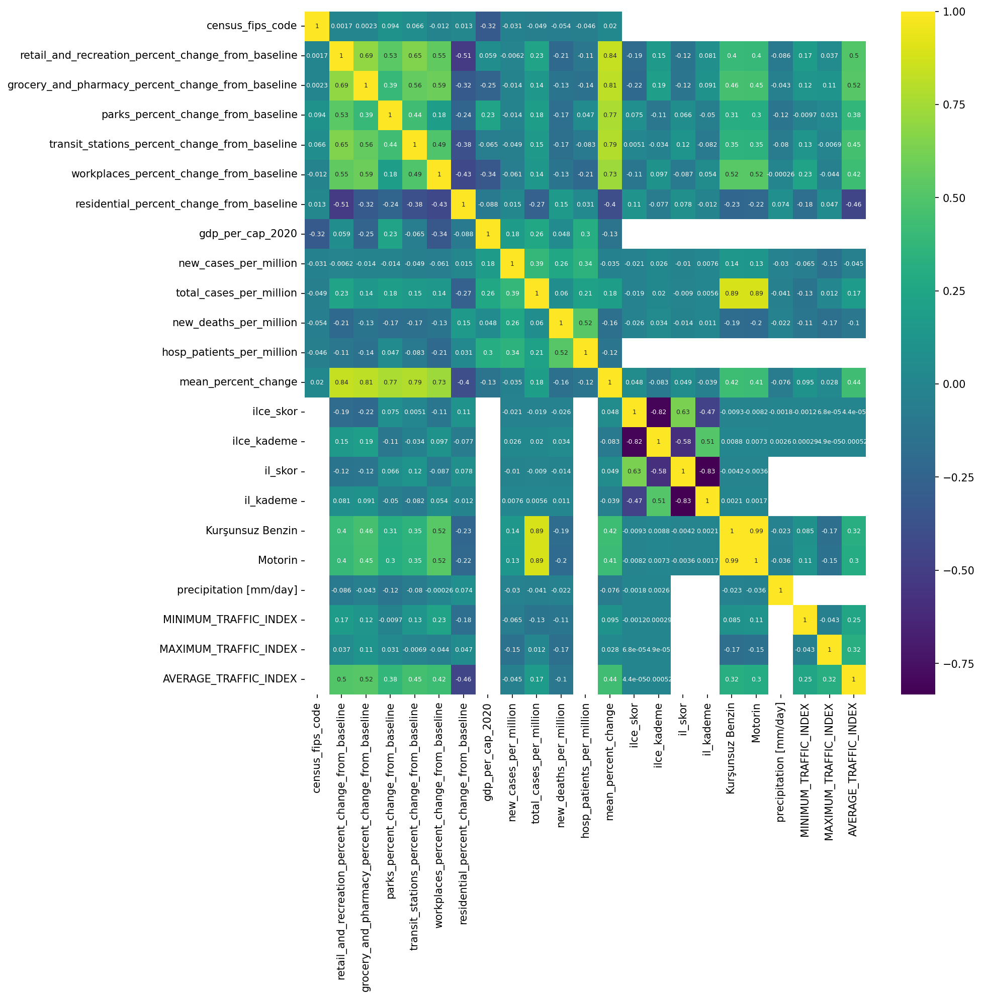

In [17]:
plt.figure(figsize=(12,12),dpi=150)
sns.heatmap(df.corr(),cmap="viridis", annot=True, annot_kws={"fontsize": 6})

To be able to investigate the relationship between mobility change and other variables, we can begin with focusing on mean of the mobility change values, e.g. "mean_percent_change". We can draw these results:

<ul>
<li>Mean mobility change looks negatively correlated with gdp per capita but correlation value (-0.13) is too low to satisfy power of the relationship.&nbsp;</li>
<li>There is also no strong relationship between the mean mobility change and COVID19 records, e.g. cases, deaths, etc.</li>
<li>The relationship between development index values, e.g., il_kademe and ilce_kademe, is almost none.</li>
<li>At the first look, there can be seen a relatively strong relationship between fuel price (Kursunsuz_benzin) and the mean mobility change, however, we expect that increasing prices would negatively affect the mobility yet the correlation shows positive relationship. We can concluded that this relationship is a coincidence.</li>
<li>Weather plays a significant role on mobility as we know, however, precipitation amount has very low correlation with the mean mobility change.</li>
<li>The mean mobility change is highly correlated with average traffic congestion index. On the other hand, it has very low correlation with maximum and minimum traffic congestion index. In other words, average traffic during a day is affected by the pandemy, whereas, peak traffic hours did not affected.</li>
</ul>

<b>Important Note: </b>Please note that we cannot conclude the relationships by only examining the correlation matrix. These are the average values and the graphs should be analyzed carefully.

<br>

##### 3.1.2. Outlier Countries 

Let's group the countries together and find the outlier countries.

In [19]:
df_bycountry = df.groupby("country_region").mean()

In [20]:
df_bycountry.head()

,census_fips_code,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,gdp_per_cap_2020,new_cases_per_million,total_cases_per_million,...,ilce_skor,ilce_kademe,il_skor,il_kademe,Kurşunsuz Benzin,Motorin,precipitation [mm/day],MINIMUM_TRAFFIC_INDEX,MAXIMUM_TRAFFIC_INDEX,AVERAGE_TRAFFIC_INDEX
country_region,,,,,,,,,,,,,,,,,,,,,
Afghanistan,NaN,28.449121,68.016332,26.825093,-3.283099,-4.839829,4.635810,516.747871,4.811977,2396.956599,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Angola,NaN,18.976477,24.420701,49.769917,-1.894737,-0.017139,4.293880,1776.166868,3.789821,1066.454431,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Antigua and Barbuda,NaN,1.362663,4.368609,59.826992,-34.857976,-26.130075,1.518855,13992.744480,105.242824,22136.455863,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Argentina,NaN,-21.459172,8.606587,-41.396810,-29.584405,2.255780,6.781469,8579.017773,242.217742,81270.644198,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Aruba,NaN,-5.042806,2.637337,30.442331,-38.437574,-13.986047,1.650474,NaN,438.625654,119654.571796,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
df.columns

Index(['country_region_code', 'country_region', 'sub_region_1', 'sub_region_2',
       'metro_area', 'iso_3166_2_code', 'census_fips_code', 'place_id', 'date',
       'retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline', 'gdp_per_cap_2020',
       'continent', 'new_cases_per_million', 'total_cases_per_million',
       'new_deaths_per_million', 'hosp_patients_per_million',
       'mean_percent_change', 'il', 'ilce', 'ilce_skor', 'ilce_kademe',
       'il_skor', 'il_kademe', 'Kurşunsuz Benzin', 'Motorin',
       'precipitation [mm/day]', 'rain', 'MINIMUM_TRAFFIC_INDEX',
       'MAXIMUM_TRAFFIC_INDEX', 'AVERAGE_TRAFFIC_INDEX'],
      dtype='object')

In [22]:
mobility_cols = ['retail_and_recreation_percent_change_from_baseline',
                 'grocery_and_pharmacy_percent_change_from_baseline',
                 'parks_percent_change_from_baseline',
                 'transit_stations_percent_change_from_baseline',
                 'workplaces_percent_change_from_baseline',
                 'residential_percent_change_from_baseline',
                 'mean_percent_change']

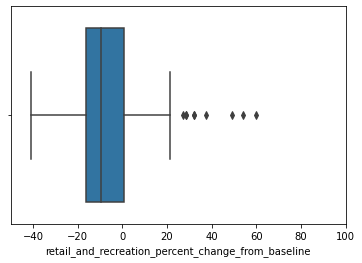

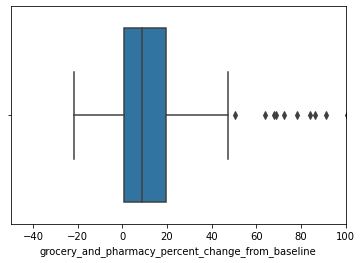

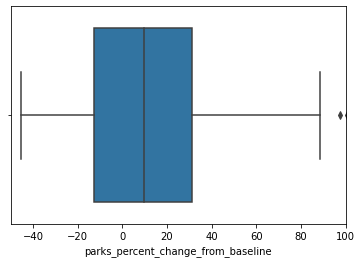

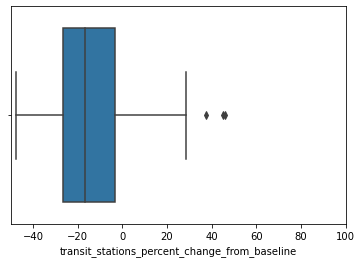

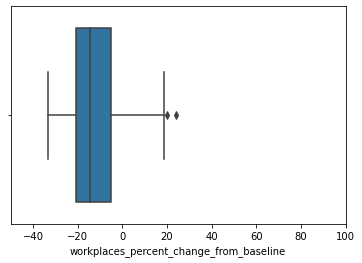

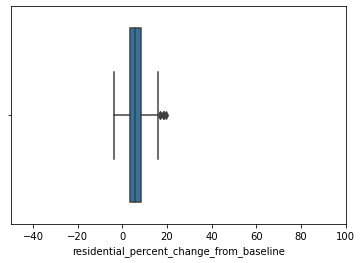

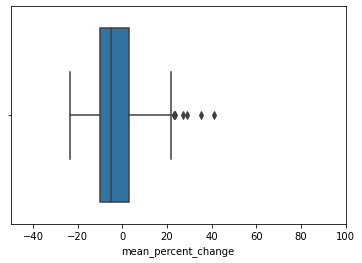

In [23]:
for i in mobility_cols:
    sns.boxplot(data = df_bycountry, x= df_bycountry[i])
    plt.xlim(-50,100)
    plt.show()

In [24]:
def get_outliers(data, col_num):
    q75,q25 = data.iloc[:,col_num].quantile([0.75,0.25])
    q50 = data.iloc[:,col_num].mean()
    iqr = q75-q25
    return data[(data.iloc[:,col_num]>q50+(1.5*iqr)) | (data.iloc[:,col_num]<q50-(1.5*iqr))]

In [26]:
get_outliers(df_bycountry,1)

,census_fips_code,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,gdp_per_cap_2020,new_cases_per_million,total_cases_per_million,...,ilce_skor,ilce_kademe,il_skor,il_kademe,Kurşunsuz Benzin,Motorin,precipitation [mm/day],MINIMUM_TRAFFIC_INDEX,MAXIMUM_TRAFFIC_INDEX,AVERAGE_TRAFFIC_INDEX
country_region,,,,,,,,,,,,,,,,,,,,,
Afghanistan,NaN,28.449121,68.016332,26.825093,-3.283099,-4.839829,4.635810,516.747871,4.811977,2396.956599,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Burkina Faso,NaN,37.483101,86.339689,72.696884,24.207355,10.276631,3.243413,857.932730,1.196247,463.581432,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Iraq,NaN,31.949192,84.213626,24.024249,26.510393,4.446882,2.503464,4145.862936,65.782557,27711.289152,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Libya,NaN,59.693382,100.651521,97.380886,11.814743,13.147636,-0.585791,3699.294765,86.087236,28342.832324,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Liechtenstein,NaN,-34.123711,-1.306122,NaN,-19.107098,-22.003339,NaN,NaN,543.339728,112368.772085,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Mongolia,NaN,31.921209,91.384661,41.110054,46.211894,18.489185,3.784065,4060.950518,315.717486,80488.118936,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Myanmar (Burma),NaN,-41.087375,-21.852194,-23.964244,-40.656878,-33.149731,18.865281,NaN,0.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Niger,NaN,49.179548,18.688776,30.801858,45.094385,-5.718323,1.184200,567.669892,0.445762,175.367173,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Panama,NaN,-32.362009,-11.052540,-45.326790,-32.984988,-25.413972,16.083141,12509.835290,242.390801,80951.767957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
for i in range(1,7):
    print(df_bycountry.columns[i])
    print(get_outliers(df_bycountry,i).index,"\n")

retail_and_recreation_percent_change_from_baseline
Index(['Afghanistan', 'Burkina Faso', 'Iraq', 'Libya', 'Liechtenstein',
       'Mongolia', 'Myanmar (Burma)', 'Niger', 'Panama', 'Papua New Guinea',
       'Yemen', 'Zambia', 'Zimbabwe'],
      dtype='object', name='country_region') 

grocery_and_pharmacy_percent_change_from_baseline
Index(['Afghanistan', 'Benin', 'Botswana', 'Burkina Faso', 'Côte d'Ivoire',
       'Egypt', 'Iraq', 'Kuwait', 'Libya', 'Mongolia', 'Myanmar (Burma)',
       'Papua New Guinea', 'Réunion', 'Yemen'],
      dtype='object', name='country_region') 

parks_percent_change_from_baseline
Index(['Greece', 'Libya', 'Mali', 'Togo'], dtype='object', name='country_region') 

transit_stations_percent_change_from_baseline
Index(['Burkina Faso', 'Cameroon', 'Iraq', 'Kazakhstan', 'Mongolia', 'Niger',
       'Papua New Guinea', 'Yemen'],
      dtype='object', name='country_region') 

workplaces_percent_change_from_baseline
Index(['Kenya', 'Libya', 'Mongolia', 'Papua New Guin

It seems that the outlier countries are mostly the same countries for each mobility change values. The common characteristics of these countries maybe ongoing wars, conflicts and low development. <br><br>

##### 3.1.3. Sample Country Analysis: Turkey Case Study

We can focus on one country in order to eliminate differences in countries because of different pandemy conditions at certain times. Since my best knowledge is where I live, Turkey is selected for further analysis. We can begin by filtering.

In [34]:
df_tr = df[df["country_region_code"] == "TR"]

In [35]:
df_tr.head()

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail_and_recreation_percent_change_from_baseline,...,ilce_kademe,il_skor,il_kademe,Kurşunsuz Benzin,Motorin,precipitation [mm/day],rain,MINIMUM_TRAFFIC_INDEX,MAXIMUM_TRAFFIC_INDEX,AVERAGE_TRAFFIC_INDEX
7555605,TR,Turkey,NaN,NaN,NaN,NaN,NaN,ChIJcSZPllwVsBQRKl9iKtTb2UA,2020-02-15,2.0,...,NaN,NaN,NaN,6.66,6.37,NaN,NaN,NaN,NaN,NaN
7555606,TR,Turkey,NaN,NaN,NaN,NaN,NaN,ChIJcSZPllwVsBQRKl9iKtTb2UA,2020-02-16,7.0,...,NaN,NaN,NaN,6.66,6.37,NaN,NaN,NaN,NaN,NaN
7555607,TR,Turkey,NaN,NaN,NaN,NaN,NaN,ChIJcSZPllwVsBQRKl9iKtTb2UA,2020-02-17,6.0,...,NaN,NaN,NaN,6.66,6.37,NaN,NaN,NaN,NaN,NaN
7555608,TR,Turkey,NaN,NaN,NaN,NaN,NaN,ChIJcSZPllwVsBQRKl9iKtTb2UA,2020-02-18,4.0,...,NaN,NaN,NaN,6.66,6.37,NaN,NaN,NaN,NaN,NaN
7555609,TR,Turkey,NaN,NaN,NaN,NaN,NaN,ChIJcSZPllwVsBQRKl9iKtTb2UA,2020-02-19,0.0,...,NaN,NaN,NaN,6.66,6.37,NaN,NaN,NaN,NaN,NaN


<br><br>At first we do not want to focus on sub regions. So, we can group them.

In [36]:
df_tr_bydate = df_tr.groupby(["date"], as_index=False).mean()

In [47]:
df_tr_bydate.head()

,date,census_fips_code,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,gdp_per_cap_2020,new_cases_per_million,...,ilce_skor,ilce_kademe,il_skor,il_kademe,Kurşunsuz Benzin,Motorin,precipitation [mm/day],MINIMUM_TRAFFIC_INDEX,MAXIMUM_TRAFFIC_INDEX,AVERAGE_TRAFFIC_INDEX
0,2020-02-15,NaN,3.225714,4.027701,-6.611570,-11.630872,6.860294,1.150171,8536.43332,0.0,...,0.807410,2.420779,0.894361,2.571429,6.66,6.37,11.4,6.0,255.0,31.0
1,2020-02-16,NaN,6.792398,6.862687,7.387534,-3.076389,5.295455,0.576923,8536.43332,0.0,...,0.844745,2.387363,0.922901,2.557692,6.66,6.37,0.0,4.0,255.0,21.0
2,2020-02-17,NaN,5.788344,6.247283,8.517572,-2.501706,9.536957,-1.292537,8536.43332,0.0,...,0.764714,2.459259,0.836936,2.654321,6.66,6.37,0.0,4.0,63.0,30.0
3,2020-02-18,NaN,5.785933,6.059783,11.083871,-2.519164,10.212254,-1.875740,8536.43332,0.0,...,0.772274,2.450249,0.845420,2.636816,6.66,6.37,0.0,6.0,255.0,32.0
4,2020-02-19,NaN,1.306991,2.152174,6.457944,-5.498270,10.248352,-1.709581,8536.43332,0.0,...,0.772417,2.446650,0.848072,2.630273,6.66,6.37,0.0,6.0,255.0,32.0


In [58]:
df_tr_bydate.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 866 entries, 0 to 865
Data columns (total 24 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                866 non-null    object 
 1   census_fips_code                                    0 non-null      float64
 2   retail_and_recreation_percent_change_from_baseline  866 non-null    float64
 3   grocery_and_pharmacy_percent_change_from_baseline   866 non-null    float64
 4   parks_percent_change_from_baseline                  866 non-null    float64
 5   transit_stations_percent_change_from_baseline       866 non-null    float64
 6   workplaces_percent_change_from_baseline             866 non-null    float64
 7   residential_percent_change_from_baseline            866 non-null    float64
 8   gdp_per_cap_2020                                    866 non-null    float64
 9  

In [59]:
df_tr_bydate["date"] = pd.DatetimeIndex(df_tr_bydate["date"])

<br><br>We should also consider the weekend effects. So we add a column to see if the day is weekend or weekday.

In [60]:
df_tr_bydate["weekend"] = df_tr_bydate["date"].dt.weekday.apply(lambda x: 1 if x >4 else 0)
df_tr_bydate["weekend"] = df_tr_bydate["weekend"].astype("category")

Then we can start visualization.

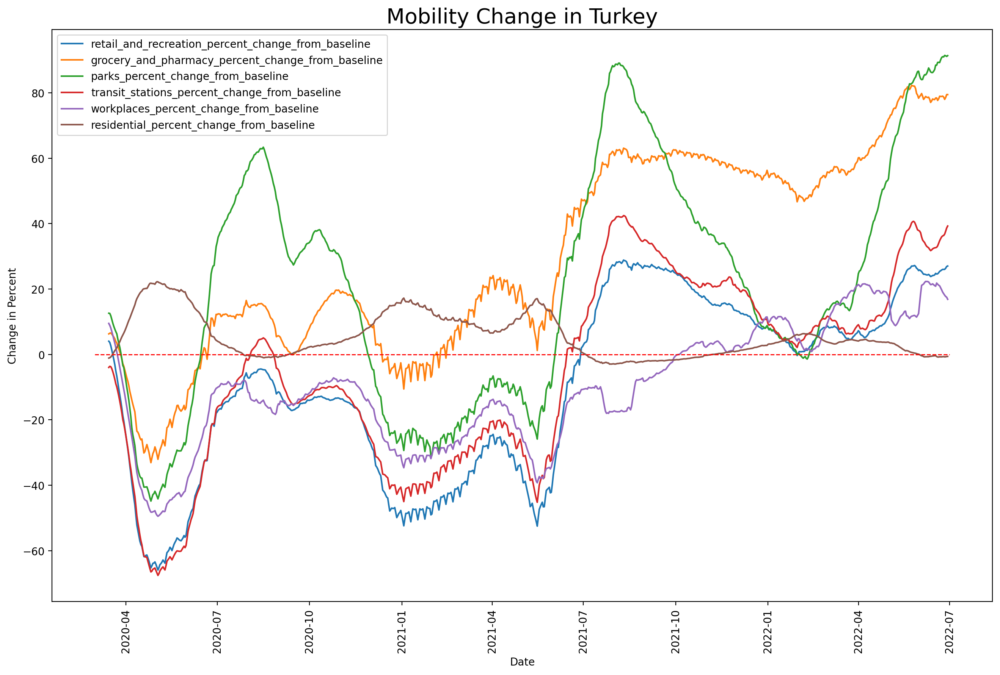

In [75]:
plt.figure(figsize=(16,10),dpi=200)

sns.lineplot(data=df_tr_bydate, x="date", y=df_tr_bydate[mobility_cols[0]].rolling( 30).mean(), label=mobility_cols[0])
sns.lineplot(data=df_tr_bydate, x="date", y=df_tr_bydate[mobility_cols[1]].rolling( 30).mean(), label=mobility_cols[1])
sns.lineplot(data=df_tr_bydate, x="date", y=df_tr_bydate[mobility_cols[2]].rolling( 30).mean(), label=mobility_cols[2])
sns.lineplot(data=df_tr_bydate, x="date", y=df_tr_bydate[mobility_cols[3]].rolling( 30).mean(), label=mobility_cols[3])
sns.lineplot(data=df_tr_bydate, x="date", y=df_tr_bydate[mobility_cols[4]].rolling( 30).mean(), label=mobility_cols[4])
sns.lineplot(data=df_tr_bydate, x="date", y=df_tr_bydate[mobility_cols[5]].rolling( 30).mean(), label=mobility_cols[5])
#sns.lineplot(data=df_tr_bydate, x="date", y=df_tr_bydate[mobility_cols[6]].rolling( 30).mean(), label=mobility_cols[6],ls="--",linewidth=8)


plt.hlines(0,pd.to_datetime("2020-03"),pd.to_datetime("2022-07"),color="r",linestyles="--",linewidth=1)

plt.xlabel("Date")
plt.ylabel("Change in Percent")

plt.xticks( rotation=90)

plt.legend()
plt.title("Mobility Change in Turkey", fontsize=20);


We can add year, month and day columns for ease of creating graphs.

In [85]:
df_tr_bydate["year"] = df_tr_bydate["date"].apply(lambda x: x.year)
df_tr_bydate["month"] = df_tr_bydate["date"].apply(lambda x: x.month)
df_tr_bydate["day"] = df_tr_bydate["date"].apply(lambda x: x.day)

In [87]:
df_tr_bydate["week_day"] = df_tr_bydate["date"].dt.weekday

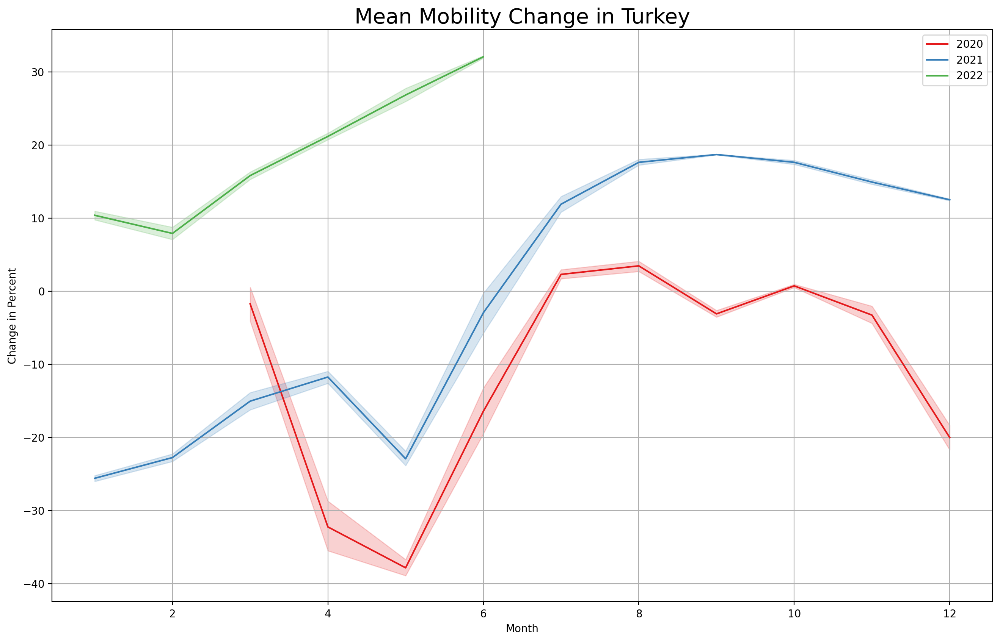

In [86]:
plt.figure(figsize=(16,10),dpi=200)

sns.lineplot(data=df_tr_bydate, x="month", y=df_tr_bydate["mean_percent_change"].rolling( 30).mean(), hue="year", palette="Set1")

plt.grid()

plt.xlabel("Month")
plt.ylabel("Change in Percent")

plt.legend()
plt.title("Mean Mobility Change in Turkey", fontsize=20);


<br><br>As seen in the above figure, there is a significant decline in mobility in 2020 and 2021, whereas, in 2022 the mobility increased to a level that is even more than before pandemy period. Let's focus on 2020 and include only weekdays.

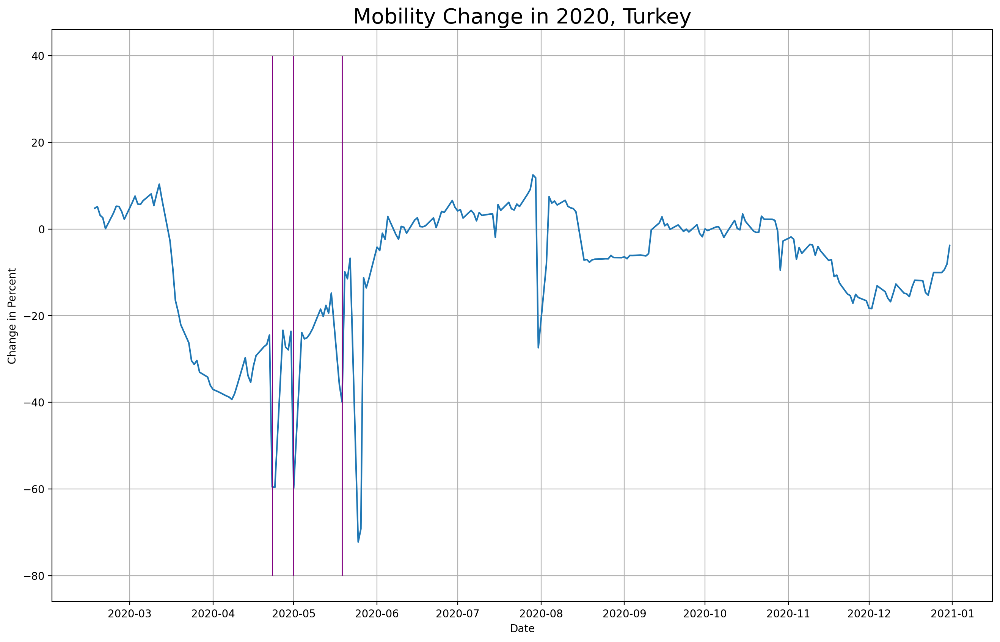

In [90]:
plt.figure(figsize=(16,10),dpi=200)

sns.lineplot(data=df_tr_bydate, x="date", 
             y=df_tr_bydate[(df_tr_bydate["weekend"]==0) & (df_tr_bydate["year"]==2020)]["mean_percent_change"], 
             palette="Set1")

plt.grid()

# Marking Some National Holidays
plt.vlines(x = pd.to_datetime("2020-04-23"), ymin=-80,ymax=40, linewidth=1, colors="purple")
plt.vlines(x = pd.to_datetime("2020-05-01"), ymin=-80,ymax=40, linewidth=1, colors="purple")
plt.vlines(x = pd.to_datetime("2020-05-19"), ymin=-80,ymax=40, linewidth=1, colors="purple")



plt.xlabel("Date")
plt.ylabel("Change in Percent")

plt.title("Mobility Change in 2020, Turkey", fontsize=20);


In the figure, it can be seen that the decline started between March and April 2020, when Turkish Govenrment begin announcing pandemy restrictions. Mobility declined dramatically, especially on National holidays.<br><br>

##### 3.1.4. City Analysis: Turkey Case Study

Now we can start focusing on cities with grouping.

In [92]:
df_tr_temp = df[df["country_region"] == "Turkey"].groupby("sub_region_1", as_index=False).mean()

In [93]:
df_tr_temp

,sub_region_1,census_fips_code,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,gdp_per_cap_2020,new_cases_per_million,...,ilce_skor,ilce_kademe,il_skor,il_kademe,Kurşunsuz Benzin,Motorin,precipitation [mm/day],MINIMUM_TRAFFIC_INDEX,MAXIMUM_TRAFFIC_INDEX,AVERAGE_TRAFFIC_INDEX
0,Adana,NaN,-5.769986,25.359170,16.100017,-19.399955,-4.973540,4.415071,8536.43332,195.068454,...,0.713818,2.421271,0.353,3.0,9.674152,9.579613,NaN,NaN,NaN,NaN
1,Adıyaman,NaN,-2.815836,27.729890,22.738589,-24.194805,-6.449038,7.637828,8536.43332,200.467655,...,-0.129074,3.493188,-0.926,6.0,9.739127,9.647227,NaN,NaN,NaN,NaN
2,Afyonkarahisar,NaN,-13.573064,29.337440,51.735455,-0.840571,-10.126878,3.304539,8536.43332,207.582375,...,-0.074294,3.502052,-0.023,4.0,9.856488,9.765861,NaN,NaN,NaN,NaN
3,Aksaray,NaN,12.859691,32.867420,7.384661,-36.681845,-2.460044,2.312209,8536.43332,204.133831,...,0.508847,2.769886,-0.271,4.0,9.714085,9.602687,NaN,NaN,NaN,NaN
4,Amasya,NaN,-11.842001,28.618121,15.109821,-23.325170,-10.777863,4.209588,8536.43332,202.591399,...,0.168554,2.857207,0.054,4.0,9.756455,9.659340,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,Çorum,NaN,-9.607227,22.849762,9.394908,-20.565773,-12.393960,3.912616,8536.43332,207.682251,...,-0.069941,3.742804,-0.262,4.0,9.828270,9.735991,NaN,NaN,NaN,NaN
77,İstanbul,NaN,-21.390388,20.264315,26.063911,7.077524,-15.484814,6.981054,8536.43332,194.599567,...,2.489259,1.256441,4.051,1.0,9.662296,9.566173,NaN,2.819844,137.955625,28.232846
78,İzmir,NaN,-11.153109,28.545930,12.567895,-6.864690,-8.163179,5.358164,8536.43332,197.594277,...,1.283125,1.888419,1.926,1.0,9.683198,9.585015,NaN,NaN,NaN,NaN
79,Şanlıurfa,NaN,1.278967,69.967624,-1.664795,-0.094183,7.065556,7.890494,8536.43332,200.794308,...,-0.561167,4.718657,-1.350,6.0,9.736833,9.641103,NaN,NaN,NaN,NaN


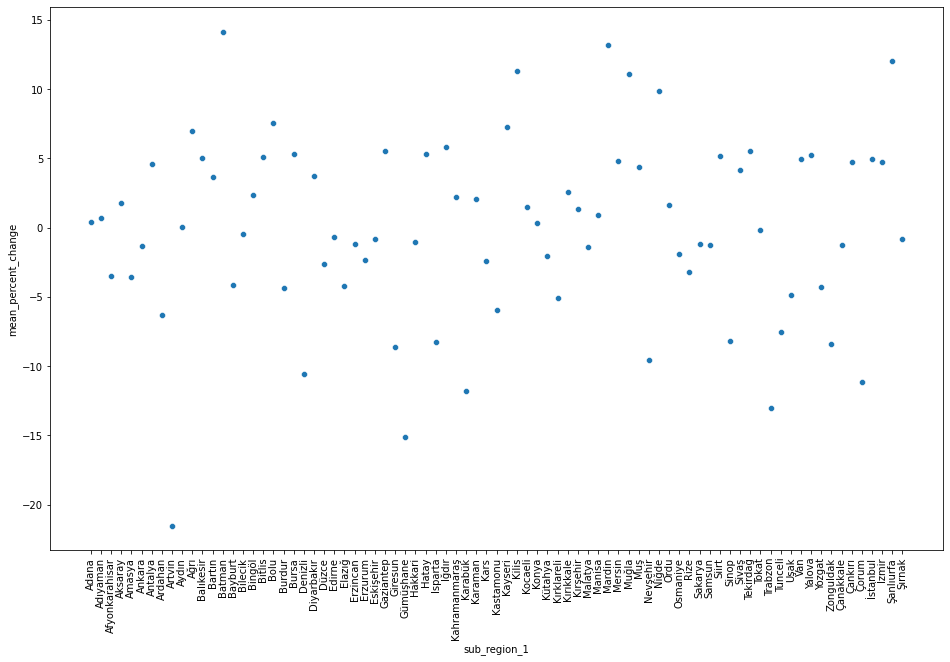

In [94]:
plt.figure(figsize=(16,10))
sns.scatterplot(data = df_tr_temp, x="sub_region_1", y="mean_percent_change")
plt.xticks(rotation=90);

The figure shows there is a significant fluctuations between cities and it seems randomly dispersed. We focus on this situations more when we examine development index.

##### 3.1.5. Comparison of Countries

Finally, it can be beneficial to examine mobility behaviour in some selected countries.

In [216]:
df_bycountry_date = df.groupby(["country_region", "date"], as_index=False).mean()

In [217]:
df_bycountry_date.head()

,country_region,date,census_fips_code,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,gdp_per_cap_2020,...,ilce_skor,ilce_kademe,il_skor,il_kademe,Kurşunsuz Benzin,Motorin,precipitation [mm/day],MINIMUM_TRAFFIC_INDEX,MAXIMUM_TRAFFIC_INDEX,AVERAGE_TRAFFIC_INDEX
0,Afghanistan,2020-02-15,NaN,-11.0,-11.0,-7.0,-2.0,-33.5,5.5,516.747871,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,2020-02-16,NaN,1.5,10.0,0.0,10.0,3.0,-0.5,516.747871,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,2020-02-17,NaN,3.5,11.0,-0.5,9.5,4.5,-1.5,516.747871,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,2020-02-18,NaN,1.0,4.5,3.0,8.5,5.0,-0.5,516.747871,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,2020-02-19,NaN,-2.5,2.5,-2.0,-0.5,3.0,1.5,516.747871,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [218]:
selected_countries = ["Turkey", "United States", "Germany", "United Arab Emirates", "India", "Netherlands"]

In [219]:
df_selectedcountries = df_bycountry_date[df_bycountry_date["country_region"].isin(selected_countries)]

In [221]:
df_selectedcountries["year"] = df_selectedcountries["date"].apply(lambda x: x.year)
df_selectedcountries["month"] = df_selectedcountries["date"].apply(lambda x: x.month)
df_selectedcountries["day"] = df_selectedcountries["date"].apply(lambda x: x.day)

/var/folders/k5/yg__kmls5zndgtyl75h907040000gn/T/ipykernel_1155/979173555.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selectedcountries["year"] = df_selectedcountries["date"].apply(lambda x: x.year)
/var/folders/k5/yg__kmls5zndgtyl75h907040000gn/T/ipykernel_1155/979173555.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selectedcountries["month"] = df_selectedcountries["date"].apply(lambda x: x.month)
/var/folders/k5/yg__kmls5zndgtyl75h907040000gn/T/ipykernel_1155/979173555.py:3: SettingWit

In [223]:
df_bycountry_date["year"] = df_bycountry_date["date"].apply(lambda x: x.year)
df_bycountry_date["month"] = df_bycountry_date["date"].apply(lambda x: x.month)
df_bycountry_date["day"] = df_bycountry_date["date"].apply(lambda x: x.day)

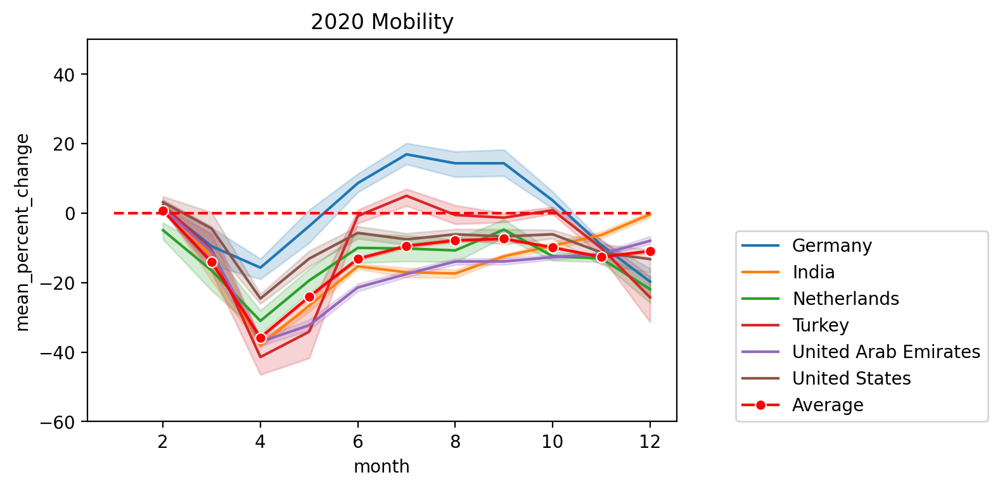

In [224]:
plt.figure(dpi=200)
sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2020], 
             x="month", y="mean_percent_change", hue="country_region")
sns.lineplot(data = df_bycountry_date[df_bycountry_date["year"] == 2020], 
             x="month", y="mean_percent_change",color="red", marker="o", label="Average")
plt.hlines(y=0,xmin=1,xmax=12, colors="red",linestyles="--")
plt.ylim(-60,50)
plt.title("2020 Mobility")
plt.legend(loc=[1.1,0]);

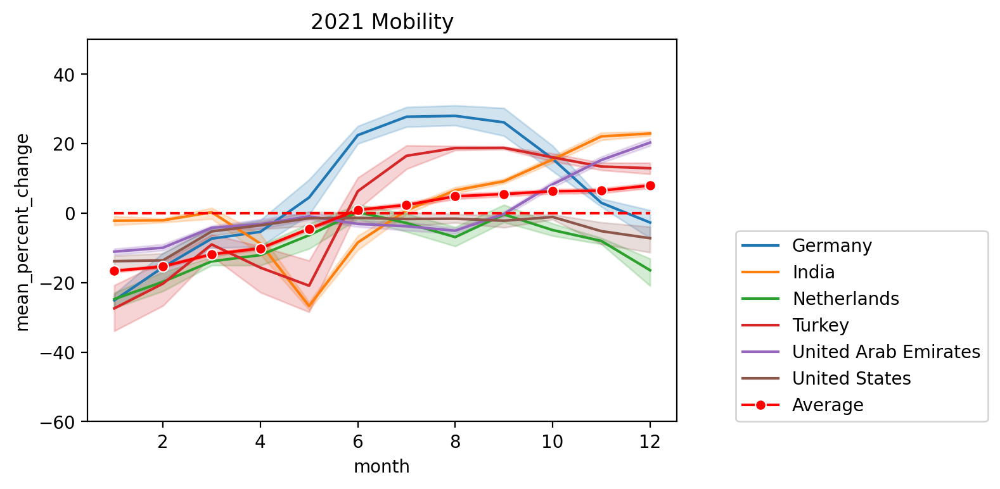

In [225]:
plt.figure(dpi=200)
sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2021], 
             x="month", y="mean_percent_change", hue="country_region")
sns.lineplot(data = df_bycountry_date[df_bycountry_date["year"] == 2021], 
             x="month", y="mean_percent_change",color="red", marker="o", label="Average")
plt.hlines(y=0,xmin=1,xmax=12, colors="red",linestyles="--")
plt.ylim(-60,50)
plt.title("2021 Mobility")
plt.legend(loc=[1.1,0]);

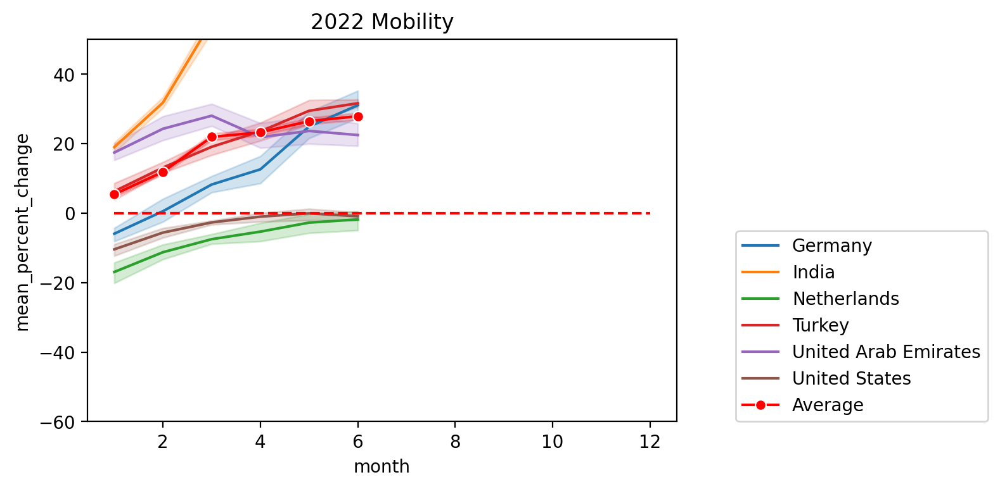

In [226]:
plt.figure(dpi=200)
sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2022], 
             x="month", y="mean_percent_change", hue="country_region")
sns.lineplot(data = df_bycountry_date[df_bycountry_date["year"] == 2022], 
             x="month", y="mean_percent_change",color="red", marker="o", label="Average")
plt.hlines(y=0,xmin=1,xmax=12, colors="red",linestyles="--")
plt.ylim(-60,50)
plt.title("2022 Mobility")
plt.legend(loc=[1.1,0]);

We can see from the figures that countries have similar mobility change patterns. 

We can apply machine learning algoritms to cluster countries for further analysis. The clustering process is done in another work in this repository. The link will be added as soon as the file is uploaded.

After the clustering of the countries in 15 groups, the final map is created as shown in the following figure.

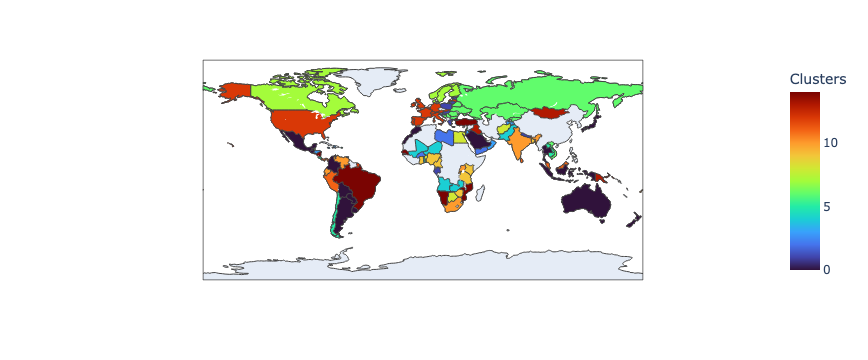

In [177]:
import plotly.express as px

fig = px.choropleth(df_temp, locations="ISO Code",
                    color="Clusters", # lifeExp is a column of gapminder
                    hover_name="Country", # column to add to hover information
                    color_continuous_scale='Turbo'
                    )
fig.show()

<br><br><br>

#### 3.2. GDP per capita

Correlation between the mobility change and GDP per capita is calculated as -0.13, which is a small value. To understand the relationship further we can draw related graphs.

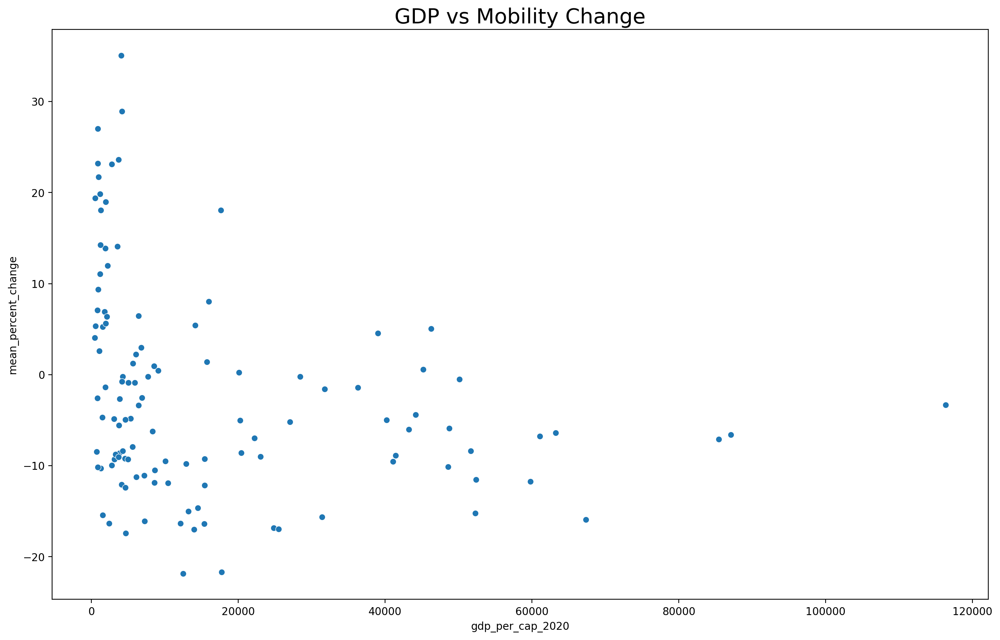

In [99]:
plt.figure(figsize=(16,10), dpi=200)

sns.scatterplot(data=df_bycountry, x= "gdp_per_cap_2020", y="mean_percent_change")

plt.title("GDP vs Mobility Change", fontsize=20);

The figure shows there is not a significant relationship. It can be useful to limit the time interval to observe the effects during pandemy. 

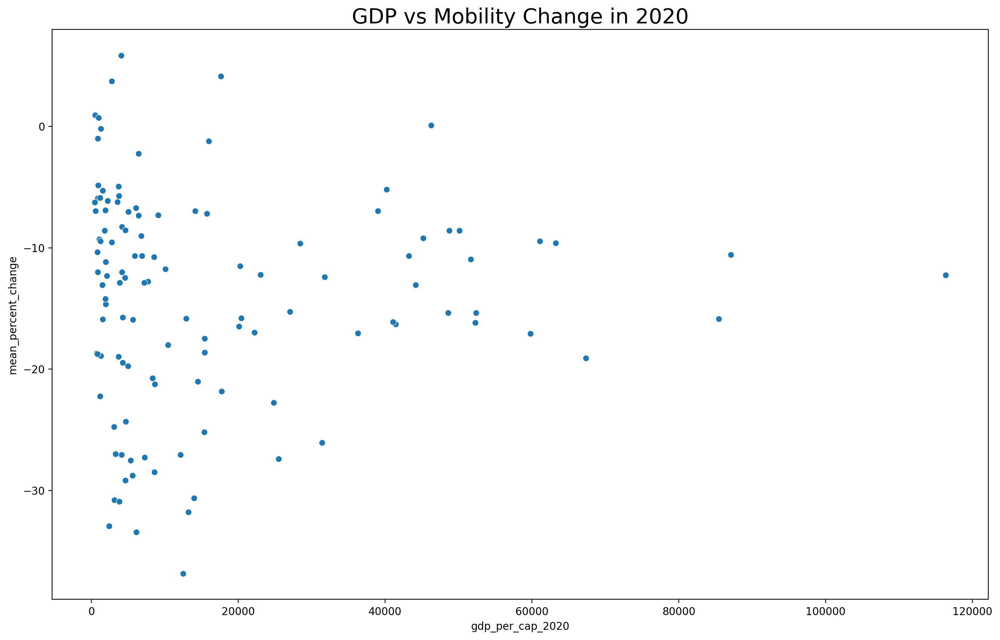

In [106]:
plt.figure(figsize=(16,10), dpi=200)

sns.scatterplot(data=df[df["date"]<pd.to_datetime("2021")].groupby("country_region").mean(), x= "gdp_per_cap_2020", y="mean_percent_change")

plt.title("GDP vs Mobility Change in 2020", fontsize=20);

As seen in the figure, when we limit our time interval, there is still no significant relationship between GDP and mean mobility change.<br><br>

#### 3.3. COVID19 Cases, Hospitalization, Deaths

Mobility change may play a role on COVID19 case records like number of new cases, hospitalized patients or deaths, at least the governments thought so; however, the correlation value was very small. To explore this visually, we can create a new dataframe that takes country averages.

In [109]:
df_bycountry_date = df.groupby(["country_region", "date"], as_index=False).mean()

In [110]:
df_bycountry_date.head()

,country_region,date,census_fips_code,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,gdp_per_cap_2020,...,ilce_skor,ilce_kademe,il_skor,il_kademe,Kurşunsuz Benzin,Motorin,precipitation [mm/day],MINIMUM_TRAFFIC_INDEX,MAXIMUM_TRAFFIC_INDEX,AVERAGE_TRAFFIC_INDEX
0,Afghanistan,2020-02-15,NaN,-11.0,-11.0,-7.0,-2.0,-33.5,5.5,516.747871,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,2020-02-16,NaN,1.5,10.0,0.0,10.0,3.0,-0.5,516.747871,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,2020-02-17,NaN,3.5,11.0,-0.5,9.5,4.5,-1.5,516.747871,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,2020-02-18,NaN,1.0,4.5,3.0,8.5,5.0,-0.5,516.747871,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,2020-02-19,NaN,-2.5,2.5,-2.0,-0.5,3.0,1.5,516.747871,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


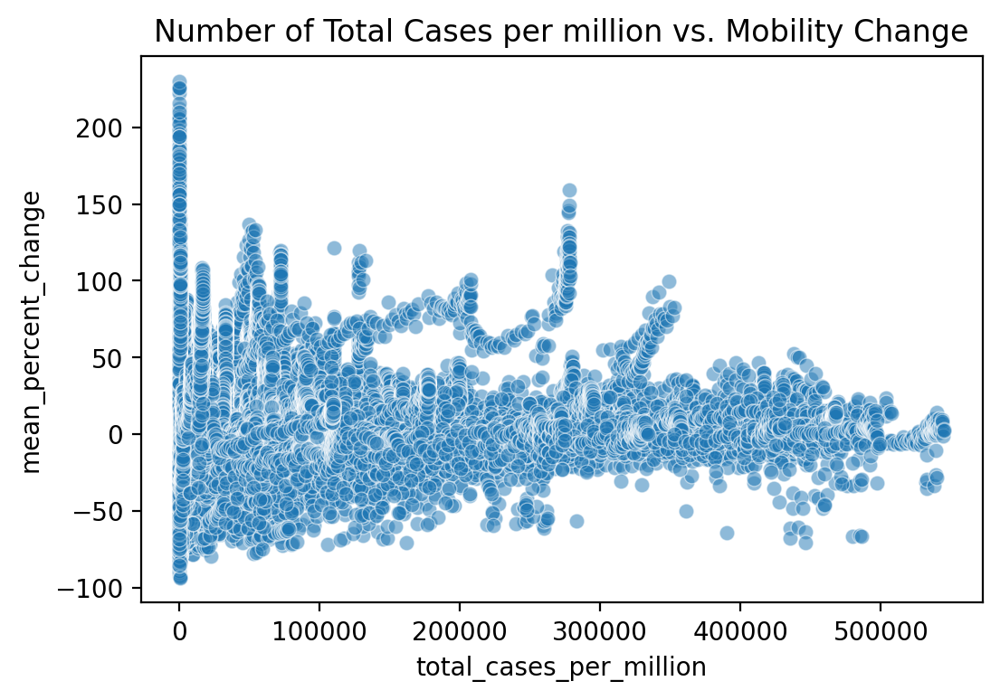

In [114]:
plt.figure(dpi=200)
sns.scatterplot(data=df_bycountry_date, 
                x="total_cases_per_million", y= "mean_percent_change", alpha=0.5)
plt.title("Number of Total Cases per million vs. Mobility Change");

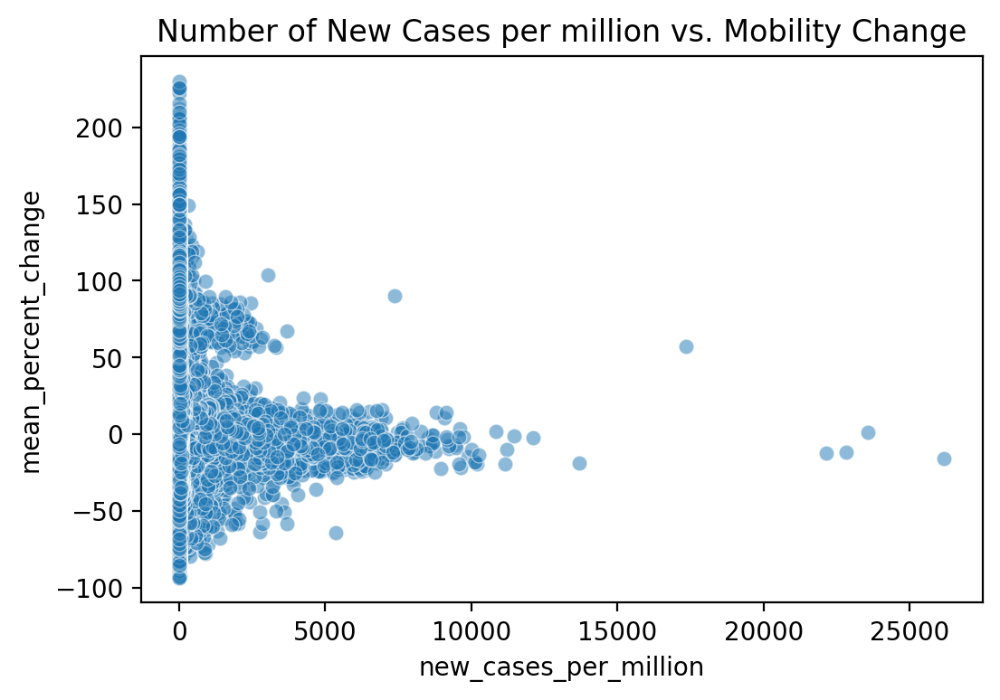

In [115]:
plt.figure(dpi=200)
sns.scatterplot(data=df_bycountry_date, 
                x="new_cases_per_million", y= "mean_percent_change", alpha=0.5)
plt.title("Number of New Cases per million vs. Mobility Change");

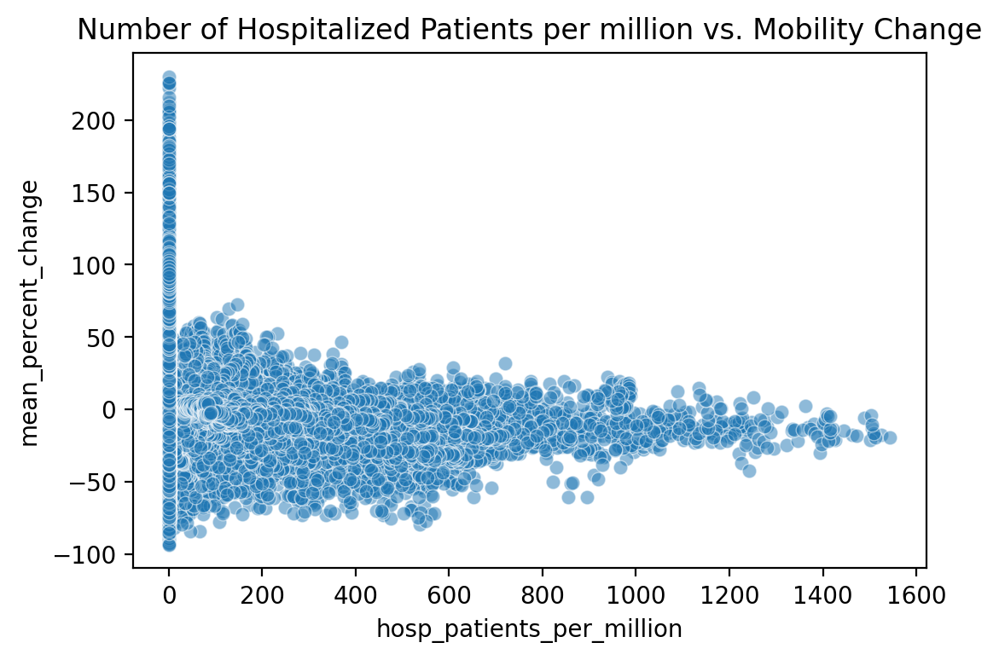

In [116]:
plt.figure(dpi=200)
sns.scatterplot(data=df_bycountry_date, 
                x="hosp_patients_per_million", y= "mean_percent_change", alpha=0.5)
plt.title("Number of Hospitalized Patients per million vs. Mobility Change");

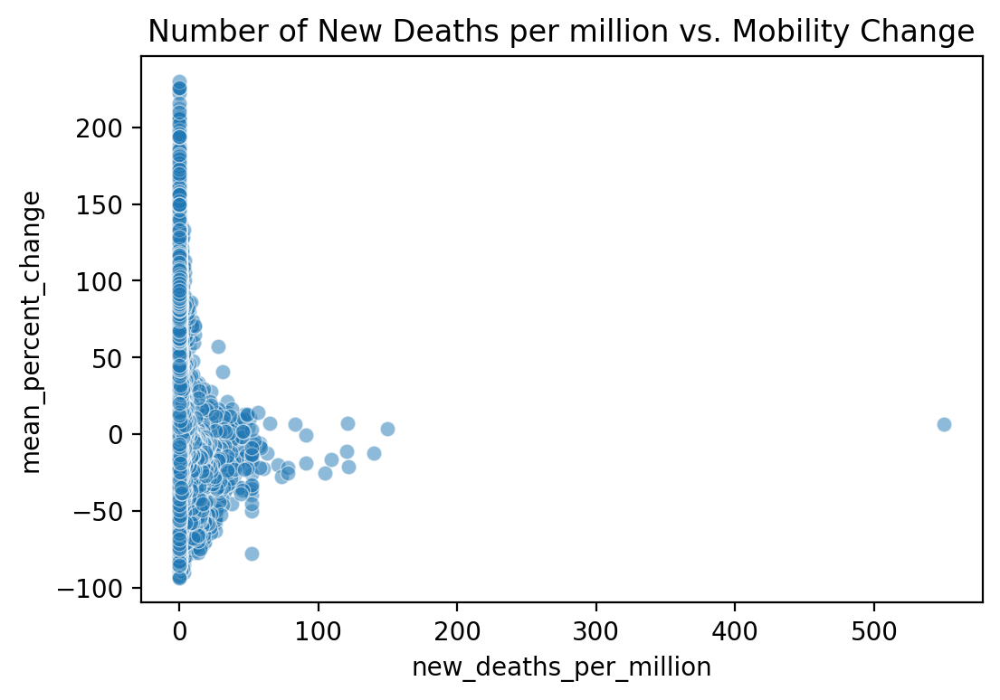

In [117]:
plt.figure(dpi=200)
sns.scatterplot(data=df_bycountry_date, 
                x="new_deaths_per_million", y= "mean_percent_change", alpha=0.5)
plt.title("Number of New Deaths per million vs. Mobility Change");

As seen in the above figures, there is no clear relationship between the COVID19 case records and the mobility changes. Thus, we can conclude that people do not react to announced records when they decide to travel.<br><br>

To analyze this relationship with respect to time, we can select some countries.

In [118]:
selected_countries = ["Turkey", "United States", "Germany", "United Arab Emirates", "India", "Netherlands"]

In [119]:
df_selectedcountries = df_bycountry_date[df_bycountry_date["country_region"].isin(selected_countries)]

In [121]:
df_selectedcountries["year"] = df_selectedcountries["date"].apply(lambda x: x.year)
df_selectedcountries["month"] = df_selectedcountries["date"].apply(lambda x: x.month)
df_selectedcountries["day"] = df_selectedcountries["date"].apply(lambda x: x.day)

/var/folders/k5/yg__kmls5zndgtyl75h907040000gn/T/ipykernel_1155/979173555.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selectedcountries["year"] = df_selectedcountries["date"].apply(lambda x: x.year)
/var/folders/k5/yg__kmls5zndgtyl75h907040000gn/T/ipykernel_1155/979173555.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selectedcountries["month"] = df_selectedcountries["date"].apply(lambda x: x.month)
/var/folders/k5/yg__kmls5zndgtyl75h907040000gn/T/ipykernel_1155/979173555.py:3: SettingWit

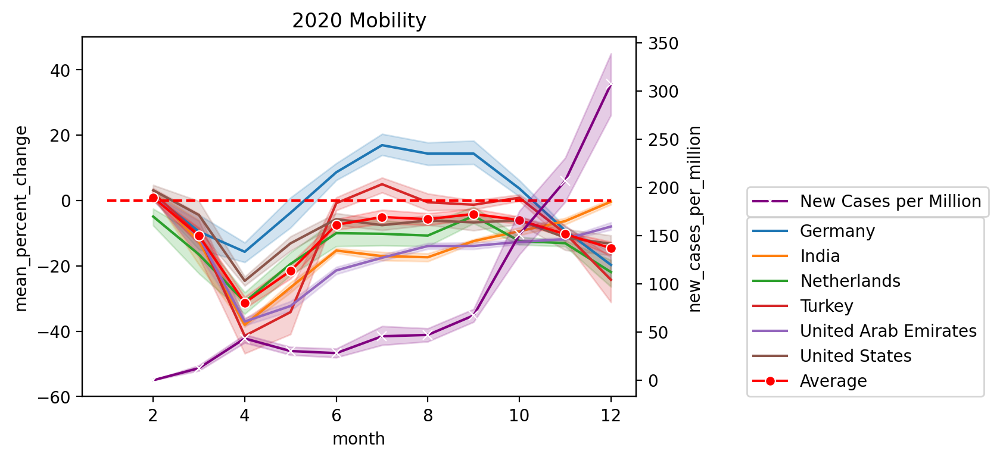

In [125]:
plt.figure(dpi=200)

sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2020], 
             x="month", y="mean_percent_change", hue="country_region")
sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2020], 
             x="month", y="mean_percent_change",color="red", marker="o", label="Average")
plt.hlines(y=0,xmin=1,xmax=12, colors="red",linestyles="--")
plt.ylim(-60,50)
plt.legend(loc=[1.2,0])

ax2 = plt.twinx()
sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2020], 
             x="month", y="new_cases_per_million", label = "New Cases per Million", 
             color="purple", marker="x", ax=ax2)




plt.title("2020 Mobility")
plt.legend(loc=[1.2,0.5]);

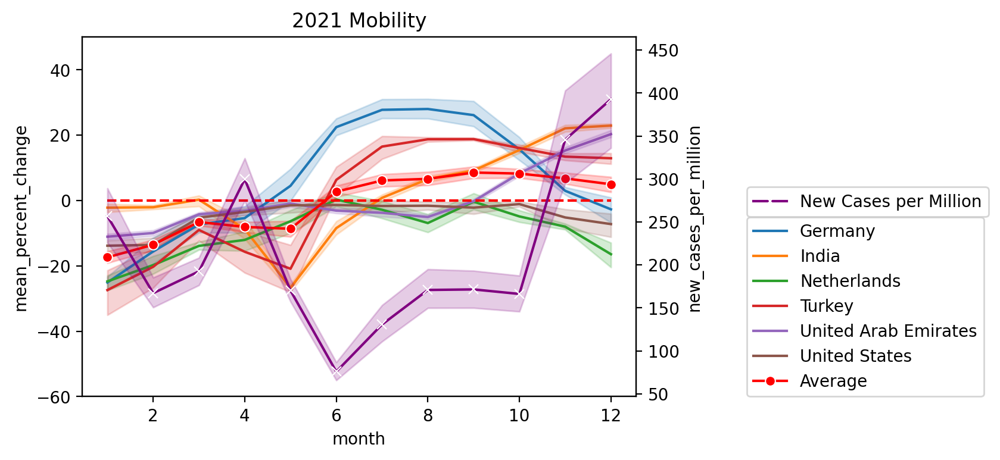

In [126]:
plt.figure(dpi=200)

sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2021], 
             x="month", y="mean_percent_change", hue="country_region")
sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2021], 
             x="month", y="mean_percent_change",color="red", marker="o", label="Average")
plt.hlines(y=0,xmin=1,xmax=12, colors="red",linestyles="--")
plt.ylim(-60,50)
plt.legend(loc=[1.2,0])

ax2 = plt.twinx()
sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2021], 
             x="month", y="new_cases_per_million", label = "New Cases per Million", 
             color="purple", marker="x", ax=ax2)




plt.title("2021 Mobility")
plt.legend(loc=[1.2,0.5]);

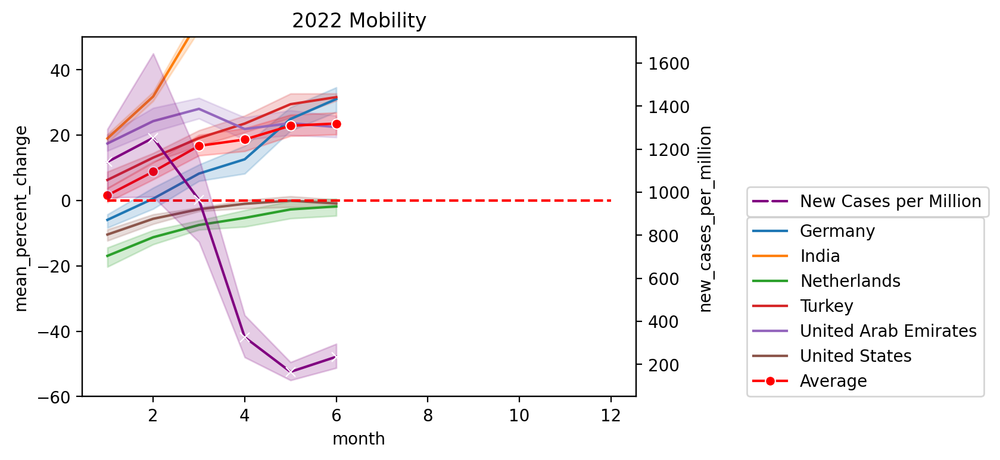

In [127]:
plt.figure(dpi=200)

sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2022], 
             x="month", y="mean_percent_change", hue="country_region")
sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2022], 
             x="month", y="mean_percent_change",color="red", marker="o", label="Average")
plt.hlines(y=0,xmin=1,xmax=12, colors="red",linestyles="--")
plt.ylim(-60,50)
plt.legend(loc=[1.2,0])

ax2 = plt.twinx()
sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2022], 
             x="month", y="new_cases_per_million", label = "New Cases per Million", 
             color="purple", marker="x", ax=ax2)




plt.title("2022 Mobility")
plt.legend(loc=[1.2,0.5]);

The figures showing the relationship between the mobility change and the number of new cases per million with respect to time explains that there is no significant correlation.<br><br>

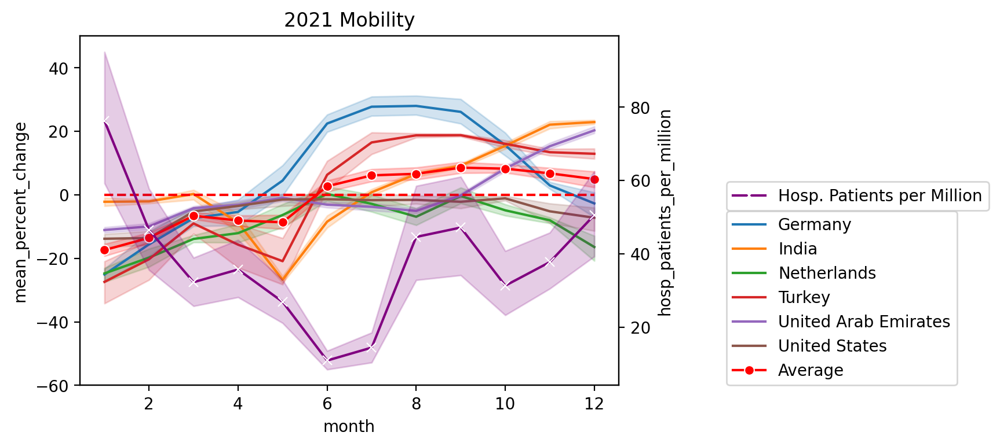

In [130]:
plt.figure(dpi=200)

sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2021], 
             x="month", y="mean_percent_change", hue="country_region")
sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2021], 
             x="month", y="mean_percent_change",color="red", marker="o", label="Average")
plt.hlines(y=0,xmin=1,xmax=12, colors="red",linestyles="--")
plt.ylim(-60,50)
plt.legend(loc=[1.2,0])

ax2 = plt.twinx()
sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2021], 
             x="month", y="hosp_patients_per_million", label = "Hosp. Patients per Million", 
             color="purple", marker="x", ax=ax2)




plt.title("2021 Mobility")
plt.legend(loc=[1.2,0.5]);

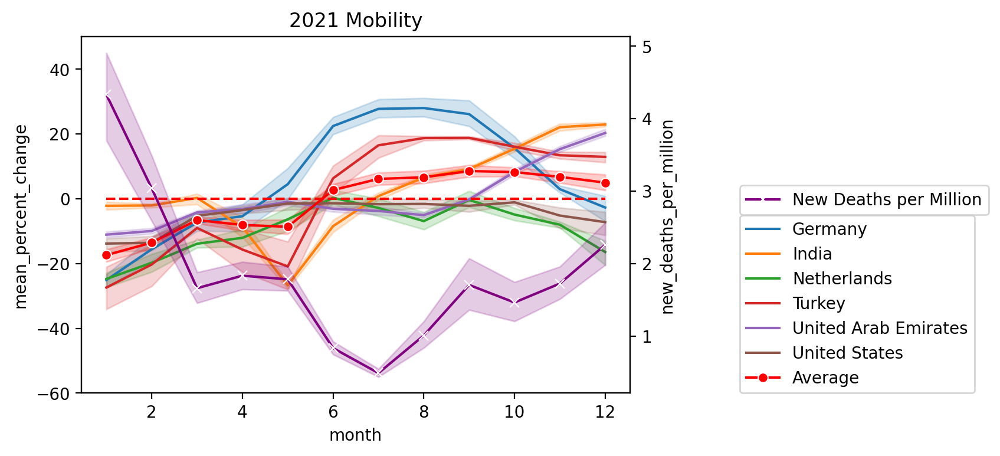

In [131]:
plt.figure(dpi=200)

sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2021], 
             x="month", y="mean_percent_change", hue="country_region")
sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2021], 
             x="month", y="mean_percent_change",color="red", marker="o", label="Average")
plt.hlines(y=0,xmin=1,xmax=12, colors="red",linestyles="--")
plt.ylim(-60,50)
plt.legend(loc=[1.2,0])

ax2 = plt.twinx()
sns.lineplot(data = df_selectedcountries[df_selectedcountries["year"] == 2021], 
             x="month", y="new_deaths_per_million", label = "New Deaths per Million", 
             color="purple", marker="x", ax=ax2)




plt.title("2021 Mobility")
plt.legend(loc=[1.2,0.5]);

The other case records, hospitalized patients and new deaths, have also no correlation with the mobility change.

<br><br><br>

#### 3.4. Weather

There is a clear relationship between the seasons and the mobility change. Therefore, in this section we can explore the relationship between the precipitation and the mobility change. To do that, let's choose a sample location, Bursa, Turkey.

In [142]:
df_bursa = df[df["sub_region_1"] == "Bursa"].groupby("date", as_index=False).mean()

In [143]:
df_bursa.head()

,date,census_fips_code,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,gdp_per_cap_2020,new_cases_per_million,...,ilce_skor,ilce_kademe,il_skor,il_kademe,Kurşunsuz Benzin,Motorin,precipitation [mm/day],MINIMUM_TRAFFIC_INDEX,MAXIMUM_TRAFFIC_INDEX,AVERAGE_TRAFFIC_INDEX
0,2020-02-15,NaN,-0.785714,-0.076923,-10.454545,-7.125,7.928571,1.000000,8536.43332,0.0,...,0.982615,2.153846,1.336,1.0,6.66,6.37,11.4,NaN,NaN,NaN
1,2020-02-16,NaN,-0.071429,5.750000,-2.272727,-2.250,7.250000,1.000000,8536.43332,0.0,...,0.982615,2.153846,1.336,1.0,6.66,6.37,0.0,NaN,NaN,NaN
2,2020-02-17,NaN,3.846154,3.692308,9.444444,2.875,8.500000,-1.333333,8536.43332,0.0,...,0.982615,2.153846,1.336,1.0,6.66,6.37,0.0,NaN,NaN,NaN
3,2020-02-18,NaN,4.615385,4.692308,16.777778,1.750,8.428571,-2.083333,8536.43332,0.0,...,0.982615,2.153846,1.336,1.0,6.66,6.37,0.0,NaN,NaN,NaN
4,2020-02-19,NaN,-0.923077,-0.230769,7.333333,-3.375,8.000000,-1.750000,8536.43332,0.0,...,0.982615,2.153846,1.336,1.0,6.66,6.37,0.0,NaN,NaN,NaN


People decide to travel based on if there is rain or not. So we can add a boolean value. Furthermore, we can add a weekend boolean.

In [146]:
df_bursa ["precipitation_bool"] = df_bursa["precipitation [mm/day]"].apply(lambda x: "yes" if x>0 else "no")

In [144]:
df_bursa["weekend"] = df_bursa["date"].dt.weekday.apply(lambda x: 1 if x >4 else 0)
df_bursa["weekend"] = df_bursa["weekend"].astype("category")

In [147]:
df_bursa.head()

,date,census_fips_code,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,gdp_per_cap_2020,new_cases_per_million,...,il_skor,il_kademe,Kurşunsuz Benzin,Motorin,precipitation [mm/day],MINIMUM_TRAFFIC_INDEX,MAXIMUM_TRAFFIC_INDEX,AVERAGE_TRAFFIC_INDEX,weekend,precipitation_bool
0,2020-02-15,NaN,-0.785714,-0.076923,-10.454545,-7.125,7.928571,1.000000,8536.43332,0.0,...,1.336,1.0,6.66,6.37,11.4,NaN,NaN,NaN,1,yes
1,2020-02-16,NaN,-0.071429,5.750000,-2.272727,-2.250,7.250000,1.000000,8536.43332,0.0,...,1.336,1.0,6.66,6.37,0.0,NaN,NaN,NaN,1,no
2,2020-02-17,NaN,3.846154,3.692308,9.444444,2.875,8.500000,-1.333333,8536.43332,0.0,...,1.336,1.0,6.66,6.37,0.0,NaN,NaN,NaN,0,no
3,2020-02-18,NaN,4.615385,4.692308,16.777778,1.750,8.428571,-2.083333,8536.43332,0.0,...,1.336,1.0,6.66,6.37,0.0,NaN,NaN,NaN,0,no
4,2020-02-19,NaN,-0.923077,-0.230769,7.333333,-3.375,8.000000,-1.750000,8536.43332,0.0,...,1.336,1.0,6.66,6.37,0.0,NaN,NaN,NaN,0,no


Let's create a pairplot and boxplots to examine effect of the precipitation.

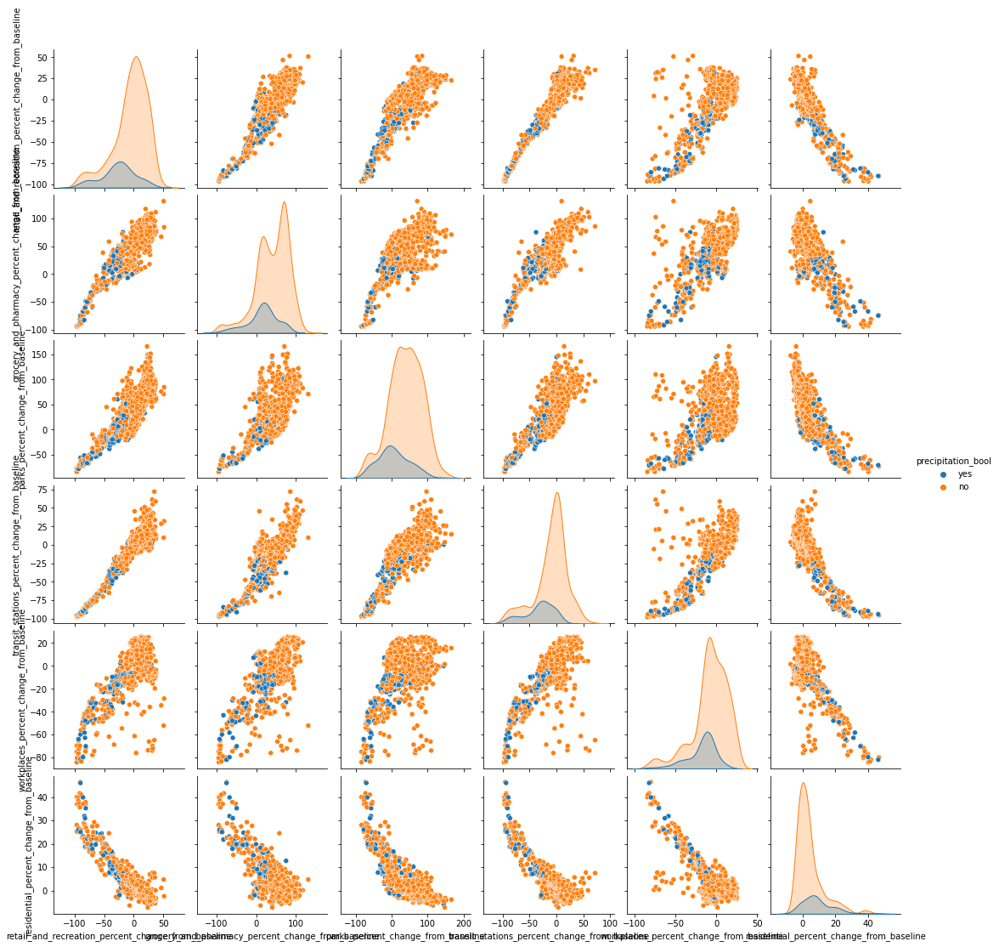

In [150]:
sns.pairplot(data = df_bursa[['retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline',"precipitation_bool"]], hue="precipitation_bool");

<br><br><br>

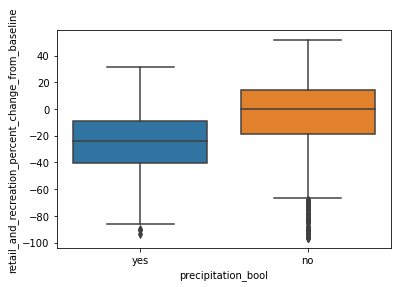

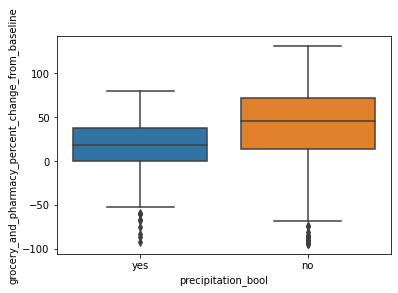

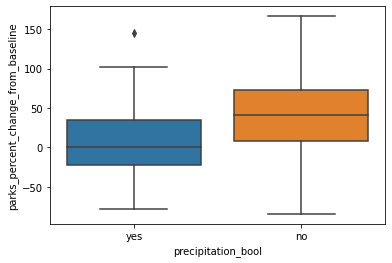

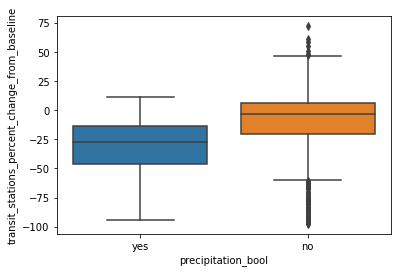

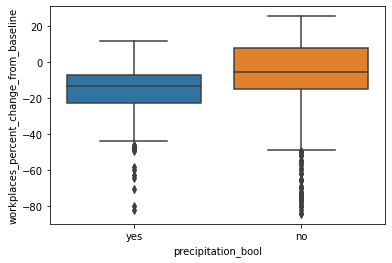

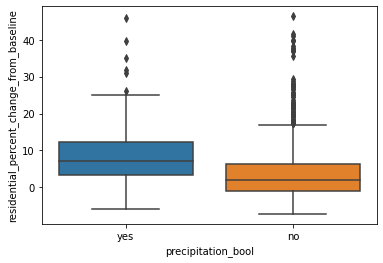

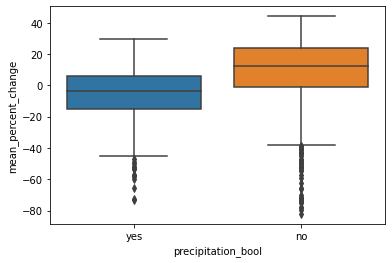

In [152]:

for i in mobility_cols:
    sns.boxplot(data=df_bursa, y = df_bursa[i], x="precipitation_bool")
    plt.show()

We can say that there is a relationship between the precipitation and the mobility changes. Now the question is if the effect of the precipitation is statistically significant. We can make ANOVA analysis to achieve that. 

ANOVA and other statistical tests are explanied in another work in this repository. The link will be given as soon as it is uploaded.<br><br>

Similarly, let's check the effect of weekends on the mobility changes.

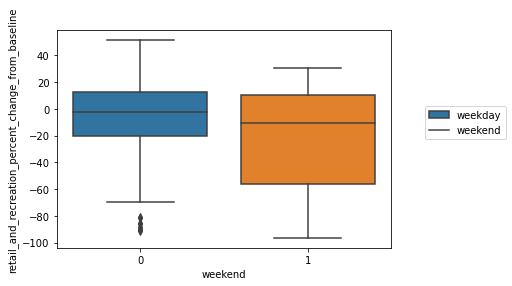

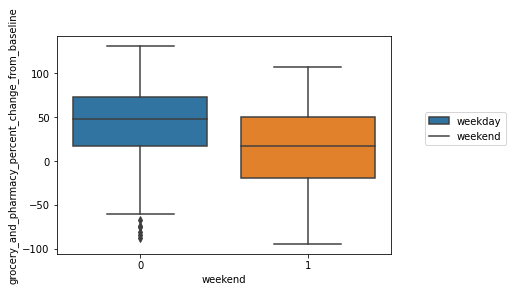

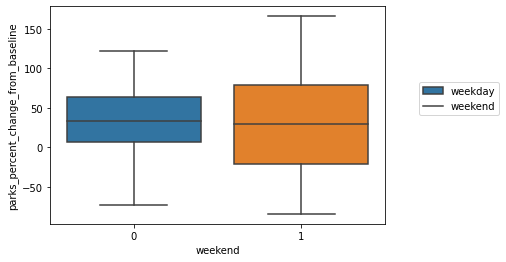

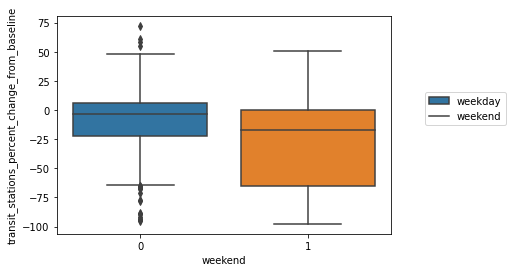

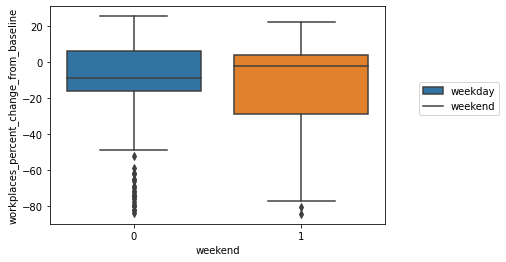

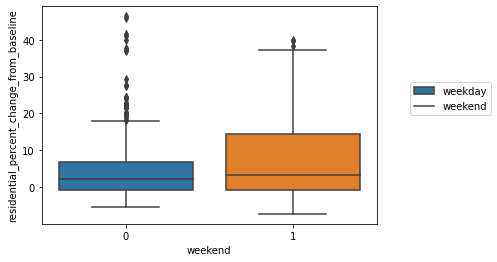

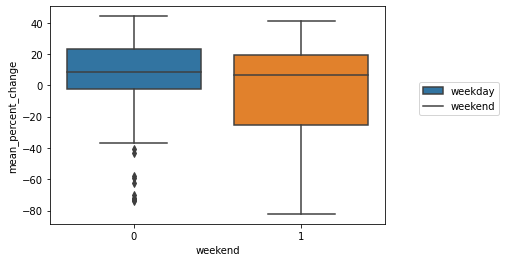

In [154]:

for i in mobility_cols:
    sns.boxplot(data=df_bursa, y = df_bursa[i], x="weekend")
    plt.legend(labels=["weekday", "weekend"], loc=[1.1,0.5])
    plt.show()

We can conclude that weekday also has an effect on the mobility changes.

<br><br><br>

#### 3.5. Traffic

To explore the relationship between the traffic congestion and the mobility changes, the traffic congestion data of Istanbul, Turkey is imported. 

The data collection process is explained in another work in this repository. Check out https://github.com/DrFarukAydin/data-science-portfolio/blob/main/data-collection-merging-and-cleaning/mobility-dataframe-preparation.ipynb

To begin with we create a dataframe by filtering Istanbul.

In [165]:
df_traffic_ist = df[df["sub_region_1"] == "İstanbul"]

In [166]:
df_traffic_ist.head()

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail_and_recreation_percent_change_from_baseline,...,ilce_kademe,il_skor,il_kademe,Kurşunsuz Benzin,Motorin,precipitation [mm/day],rain,MINIMUM_TRAFFIC_INDEX,MAXIMUM_TRAFFIC_INDEX,AVERAGE_TRAFFIC_INDEX
7759182,TR,Turkey,İstanbul,NaN,NaN,TR-34,NaN,ChIJexVgWlG2yhQR6B1akfSarCI,2020-02-15,0.0,...,NaN,NaN,NaN,6.66,6.37,NaN,NaN,6.0,255.0,31.0
7759183,TR,Turkey,İstanbul,NaN,NaN,TR-34,NaN,ChIJexVgWlG2yhQR6B1akfSarCI,2020-02-16,7.0,...,NaN,NaN,NaN,6.66,6.37,NaN,NaN,4.0,255.0,21.0
7759184,TR,Turkey,İstanbul,NaN,NaN,TR-34,NaN,ChIJexVgWlG2yhQR6B1akfSarCI,2020-02-17,4.0,...,NaN,NaN,NaN,6.66,6.37,NaN,NaN,4.0,63.0,30.0
7759185,TR,Turkey,İstanbul,NaN,NaN,TR-34,NaN,ChIJexVgWlG2yhQR6B1akfSarCI,2020-02-18,3.0,...,NaN,NaN,NaN,6.66,6.37,NaN,NaN,6.0,255.0,32.0
7759186,TR,Turkey,İstanbul,NaN,NaN,TR-34,NaN,ChIJexVgWlG2yhQR6B1akfSarCI,2020-02-19,-1.0,...,NaN,NaN,NaN,6.66,6.37,NaN,NaN,6.0,255.0,32.0


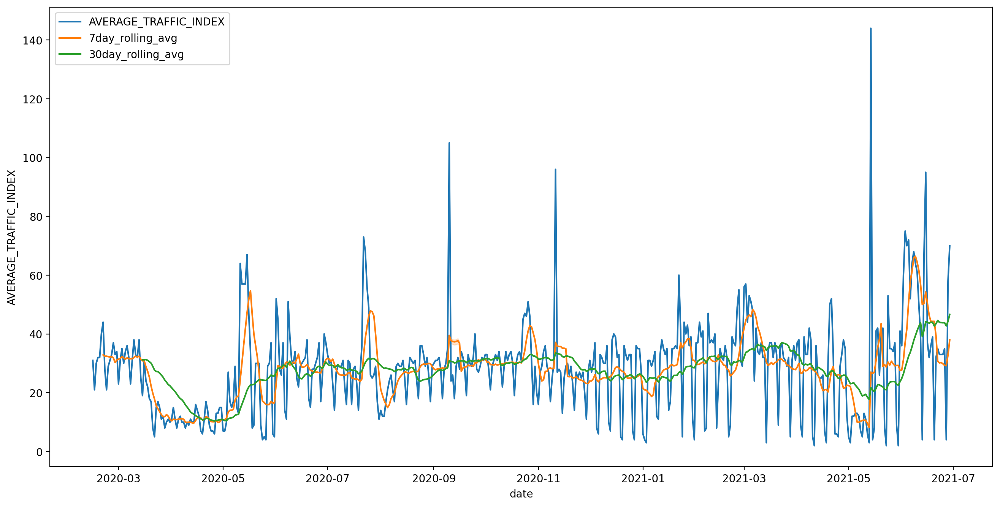

In [170]:
plt.subplots(figsize=(16,8),dpi=200)
sns.lineplot(data=df_traffic_ist, x="date", y=df_traffic_ist.AVERAGE_TRAFFIC_INDEX ,label="AVERAGE_TRAFFIC_INDEX")
sns.lineplot(data=df_traffic_ist, x="date", y=df_traffic_ist.AVERAGE_TRAFFIC_INDEX.rolling( 7).mean(), label="7day_rolling_avg")
sns.lineplot(data=df_traffic_ist, x="date", y=df_traffic_ist.AVERAGE_TRAFFIC_INDEX.rolling( 30).mean(), label="30day_rolling_avg")
plt.legend()

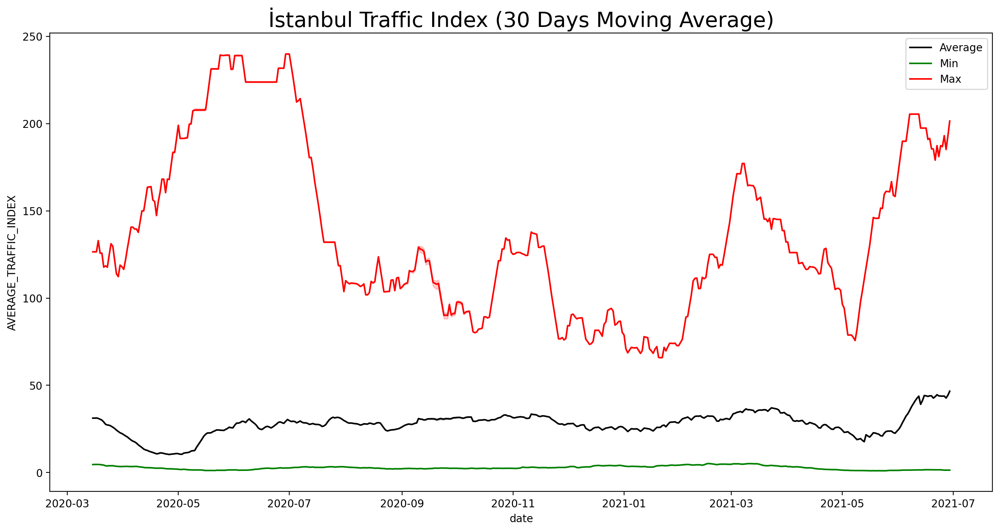

In [171]:
plt.subplots(figsize=(16,8),dpi=200)
sns.lineplot(data=df_traffic_ist, x="date", y=df_traffic_ist.AVERAGE_TRAFFIC_INDEX.rolling( 30).mean(), label="Average",color="Black")
sns.lineplot(data=df_traffic_ist, x="date", y=df_traffic_ist.MINIMUM_TRAFFIC_INDEX.rolling( 30).mean(), label="Min",color="g")
sns.lineplot(data=df_traffic_ist, x="date", y=df_traffic_ist.MAXIMUM_TRAFFIC_INDEX.rolling( 30).mean(), label="Max", color="r")
plt.title("İstanbul Traffic Index (30 Days Moving Average)", fontsize=20);

We can see that when the pandemy restrictions began, April 2020, average traffic decreased, whereas, the maximum traffic increased. Let's plot average traffic index with the mean mobility change.

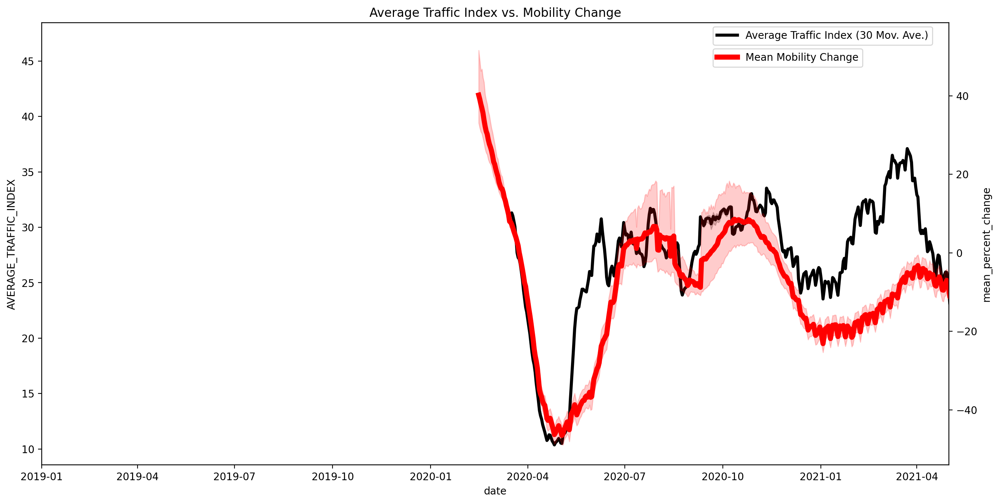

In [172]:
plt.subplots(figsize=(16,8),dpi=200)
sns.lineplot(data=df_traffic_ist, x="date", y=df_traffic_ist.AVERAGE_TRAFFIC_INDEX.rolling( 30).mean(), 
             label="Average Traffic Index (30 Mov. Ave.)",color="Black", linewidth = 3)

plt.legend(loc=[0.74,0.95])

ax2 = plt.twinx()
sns.lineplot(data= df_traffic_ist, x="date", 
             y=df_traffic_ist.mean_percent_change.rolling( 30).mean(), 
             label ="Mean Mobility Change",linewidth=5,color="r", ax=ax2)
plt.legend(loc=[0.74,0.9])
plt.xlim(pd.to_datetime("2019-01"),pd.to_datetime("2021-05"))

plt.title("Average Traffic Index vs. Mobility Change");

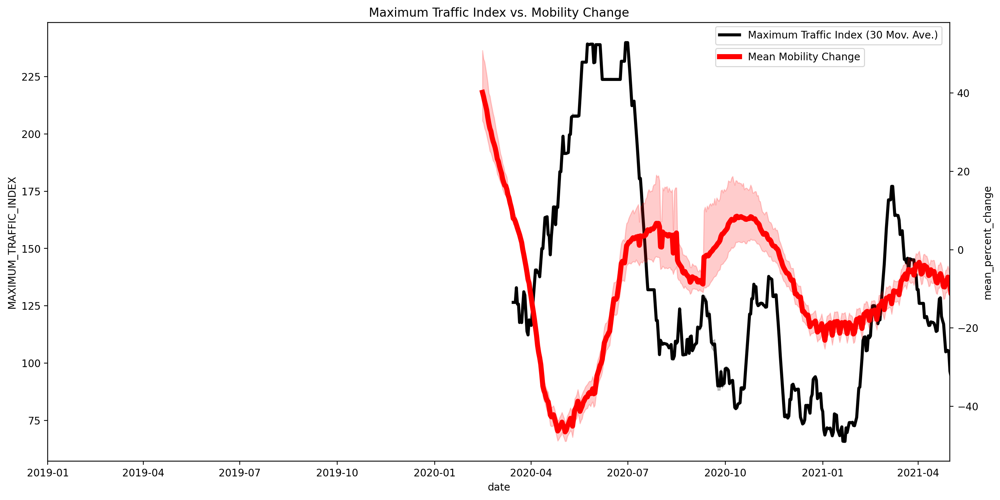

In [173]:
plt.subplots(figsize=(16,8),dpi=200)
sns.lineplot(data=df_traffic_ist, x="date", y=df_traffic_ist.MAXIMUM_TRAFFIC_INDEX.rolling( 30).mean(), 
             label="Maximum Traffic Index (30 Mov. Ave.)",color="Black", linewidth = 3)

plt.legend(loc=[0.74,0.95])

ax2 = plt.twinx()
sns.lineplot(data= df_traffic_ist, x="date", 
             y=df_traffic_ist.mean_percent_change.rolling( 30).mean(), 
             label ="Mean Mobility Change",linewidth=5,color="r", ax=ax2)
plt.legend(loc=[0.74,0.9])
plt.xlim(pd.to_datetime("2019-01"),pd.to_datetime("2021-05"))

plt.title("Maximum Traffic Index vs. Mobility Change");

As seen in the figure, there is a positive correlation between the mean mobility change and the average traffic index. On the other hand, the correlation with maximum traffic index looks negative. This may be caused by pandemy restrictions that is curfew after certain hours.

<br><br><br>

#### 3.6. Development Index

Development index is a score to evaluate development of the cities and counties in Turkey and published by the Turkish government. This is similar to GDP per capita values and may have an effect on the mobility behaviour.

The data collection process is explained in another work in this repository. Check out https://github.com/DrFarukAydin/data-science-portfolio/blob/main/data-collection-merging-and-cleaning/mobility-dataframe-preparation.ipynb

We can begin with filtering Turkey.

In [176]:
df_tr = df[df["country_region"] == "Turkey"]

In [178]:
df_tr.tail()

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail_and_recreation_percent_change_from_baseline,...,ilce_kademe,il_skor,il_kademe,Kurşunsuz Benzin,Motorin,precipitation [mm/day],rain,MINIMUM_TRAFFIC_INDEX,MAXIMUM_TRAFFIC_INDEX,AVERAGE_TRAFFIC_INDEX
8031771,TR,Turkey,Zonguldak,Merkez,NaN,NaN,NaN,ChIJ5RJc34yHnEAR6s60uOmblJc,2022-06-25,-24.0,...,2.0,0.333,3.0,27.26,29.99,NaN,NaN,NaN,NaN,NaN
8031772,TR,Turkey,Zonguldak,Merkez,NaN,NaN,NaN,ChIJ5RJc34yHnEAR6s60uOmblJc,2022-06-26,-37.0,...,2.0,0.333,3.0,27.26,29.99,NaN,NaN,NaN,NaN,NaN
8031773,TR,Turkey,Zonguldak,Merkez,NaN,NaN,NaN,ChIJ5RJc34yHnEAR6s60uOmblJc,2022-06-27,-44.0,...,2.0,0.333,3.0,27.26,29.99,NaN,NaN,NaN,NaN,NaN
8031774,TR,Turkey,Zonguldak,Merkez,NaN,NaN,NaN,ChIJ5RJc34yHnEAR6s60uOmblJc,2022-06-28,-25.0,...,2.0,0.333,3.0,27.26,29.99,NaN,NaN,NaN,NaN,NaN
8031775,TR,Turkey,Zonguldak,Merkez,NaN,NaN,NaN,ChIJ5RJc34yHnEAR6s60uOmblJc,2022-06-29,-22.0,...,2.0,0.333,3.0,27.30,27.51,NaN,NaN,NaN,NaN,NaN


We can now sort the cities based on their development score to examine the relationship with the mean mobility change.

<b>Note:</b> 'il_kademe' refers to the development level of the cities, where 1 is used for the most deeloped cities. Similarly, 'ilce_kademe' is the development level of the counties.

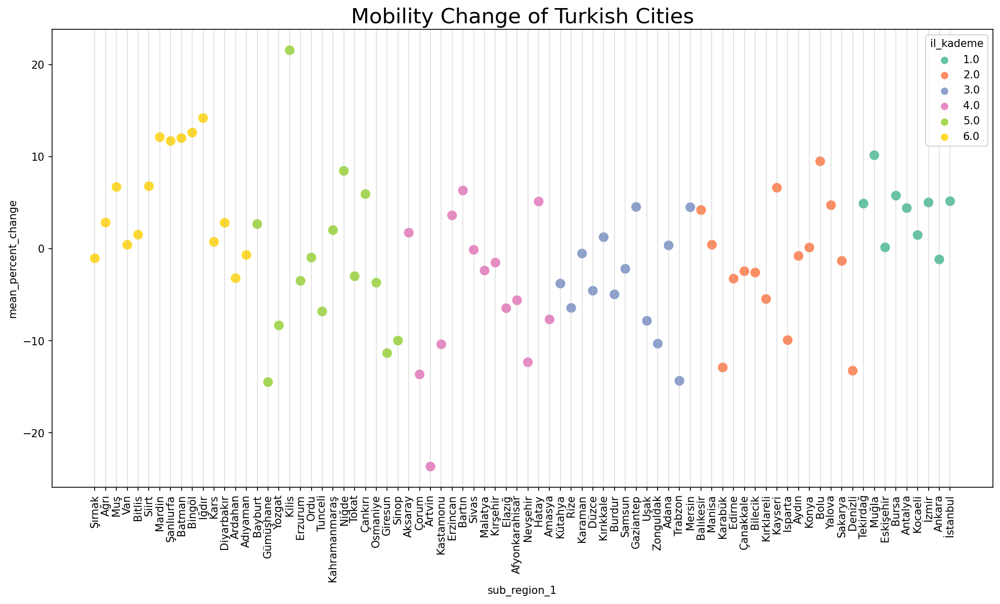

In [189]:
plt.figure(figsize=(16,8),dpi=150)

sns.scatterplot(data=df_tr.groupby(["sub_region_1","il_kademe"]).mean().sort_values("il_skor"), 
                x="sub_region_1",y="mean_percent_change", hue="il_kademe", palette="Set2", s=100)

plt.grid(axis="x", alpha=0.4)
plt.xticks(rotation=90)


plt.title("Mobility Change of Turkish Cities", fontsize=20);


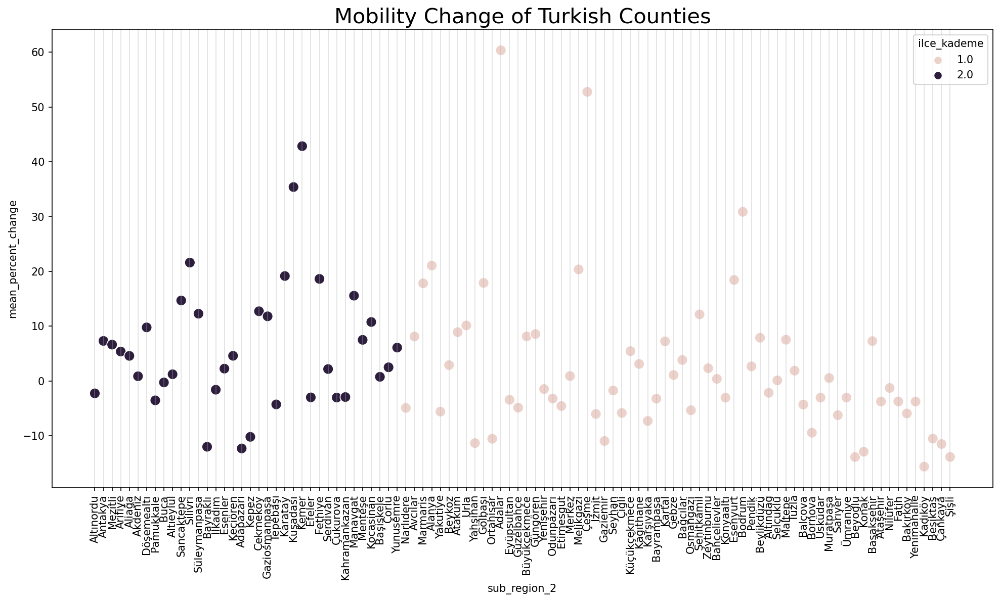

In [199]:
plt.figure(figsize=(16,8),dpi=150)

sns.scatterplot(data=df_tr.groupby(["sub_region_2","ilce_kademe"]).mean().sort_values("ilce_skor").iloc[-100:,:], 
                x="sub_region_2",y="mean_percent_change", hue="ilce_kademe", s=100)

plt.grid(axis="x", alpha=0.4)
plt.xticks(rotation=90)

plt.title("Mobility Change of Turkish Counties", fontsize=20);

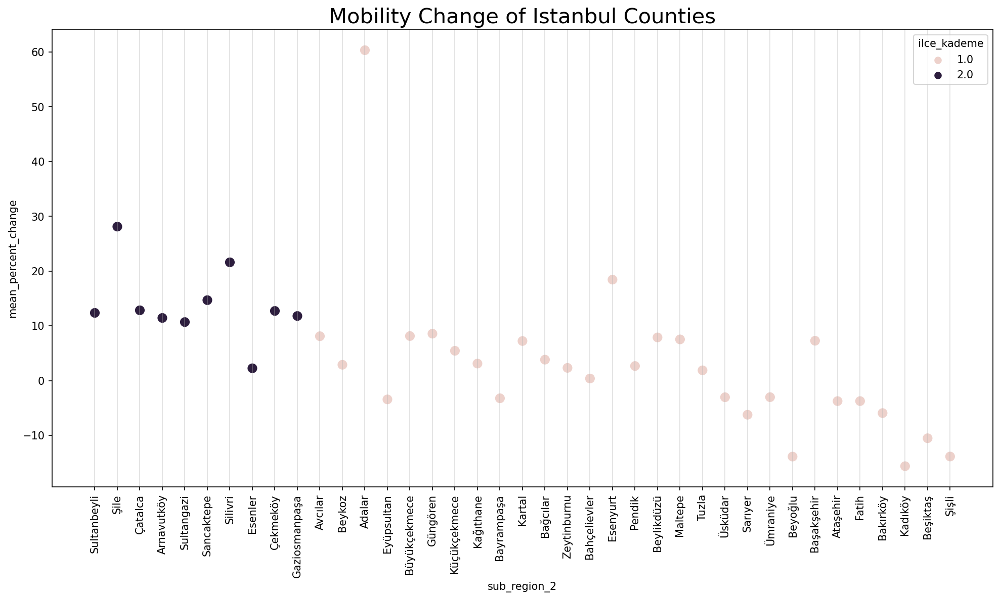

In [191]:
plt.figure(figsize=(16,8),dpi=150)

sns.scatterplot(data=df_tr[df_tr["sub_region_1"] == "İstanbul"].groupby(["sub_region_2","ilce_kademe"]).mean().sort_values("ilce_skor"), 
                x="sub_region_2",y="mean_percent_change", hue="ilce_kademe", s=100)

plt.grid(axis="x", alpha=0.4)
plt.xticks(rotation=90)

plt.title("Mobility Change of Istanbul Counties", fontsize=20);


We can conclude that there is no significant correlation between the development and the mobility behaviour. 

Let's check again by filtering May and Wednesdays seperately and together to eliminate seasonal effects.

In [192]:
df_tr.head()

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail_and_recreation_percent_change_from_baseline,...,ilce_kademe,il_skor,il_kademe,Kurşunsuz Benzin,Motorin,precipitation [mm/day],rain,MINIMUM_TRAFFIC_INDEX,MAXIMUM_TRAFFIC_INDEX,AVERAGE_TRAFFIC_INDEX
7555605,TR,Turkey,NaN,NaN,NaN,NaN,NaN,ChIJcSZPllwVsBQRKl9iKtTb2UA,2020-02-15,2.0,...,NaN,NaN,NaN,6.66,6.37,NaN,NaN,NaN,NaN,NaN
7555606,TR,Turkey,NaN,NaN,NaN,NaN,NaN,ChIJcSZPllwVsBQRKl9iKtTb2UA,2020-02-16,7.0,...,NaN,NaN,NaN,6.66,6.37,NaN,NaN,NaN,NaN,NaN
7555607,TR,Turkey,NaN,NaN,NaN,NaN,NaN,ChIJcSZPllwVsBQRKl9iKtTb2UA,2020-02-17,6.0,...,NaN,NaN,NaN,6.66,6.37,NaN,NaN,NaN,NaN,NaN
7555608,TR,Turkey,NaN,NaN,NaN,NaN,NaN,ChIJcSZPllwVsBQRKl9iKtTb2UA,2020-02-18,4.0,...,NaN,NaN,NaN,6.66,6.37,NaN,NaN,NaN,NaN,NaN
7555609,TR,Turkey,NaN,NaN,NaN,NaN,NaN,ChIJcSZPllwVsBQRKl9iKtTb2UA,2020-02-19,0.0,...,NaN,NaN,NaN,6.66,6.37,NaN,NaN,NaN,NaN,NaN


In [193]:
df_tr["year"] = df_tr["date"].apply(lambda x: x.year)
df_tr["month"] = df_tr["date"].apply(lambda x: x.month)
df_tr["day"] = df_tr["date"].apply(lambda x: x.day)

/var/folders/k5/yg__kmls5zndgtyl75h907040000gn/T/ipykernel_1155/2345257429.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tr["year"] = df_tr["date"].apply(lambda x: x.year)
/var/folders/k5/yg__kmls5zndgtyl75h907040000gn/T/ipykernel_1155/2345257429.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tr["month"] = df_tr["date"].apply(lambda x: x.month)
/var/folders/k5/yg__kmls5zndgtyl75h907040000gn/T/ipykernel_1155/2345257429.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a

In [194]:
df_tr["weekday"] = df_tr["date"].dt.weekday

/var/folders/k5/yg__kmls5zndgtyl75h907040000gn/T/ipykernel_1155/3674914451.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tr["weekday"] = df_tr["date"].dt.weekday


In [196]:
df_tr.head()

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail_and_recreation_percent_change_from_baseline,...,Motorin,precipitation [mm/day],rain,MINIMUM_TRAFFIC_INDEX,MAXIMUM_TRAFFIC_INDEX,AVERAGE_TRAFFIC_INDEX,year,month,day,weekday
7555605,TR,Turkey,NaN,NaN,NaN,NaN,NaN,ChIJcSZPllwVsBQRKl9iKtTb2UA,2020-02-15,2.0,...,6.37,NaN,NaN,NaN,NaN,NaN,2020,2,15,5
7555606,TR,Turkey,NaN,NaN,NaN,NaN,NaN,ChIJcSZPllwVsBQRKl9iKtTb2UA,2020-02-16,7.0,...,6.37,NaN,NaN,NaN,NaN,NaN,2020,2,16,6
7555607,TR,Turkey,NaN,NaN,NaN,NaN,NaN,ChIJcSZPllwVsBQRKl9iKtTb2UA,2020-02-17,6.0,...,6.37,NaN,NaN,NaN,NaN,NaN,2020,2,17,0
7555608,TR,Turkey,NaN,NaN,NaN,NaN,NaN,ChIJcSZPllwVsBQRKl9iKtTb2UA,2020-02-18,4.0,...,6.37,NaN,NaN,NaN,NaN,NaN,2020,2,18,1
7555609,TR,Turkey,NaN,NaN,NaN,NaN,NaN,ChIJcSZPllwVsBQRKl9iKtTb2UA,2020-02-19,0.0,...,6.37,NaN,NaN,NaN,NaN,NaN,2020,2,19,2


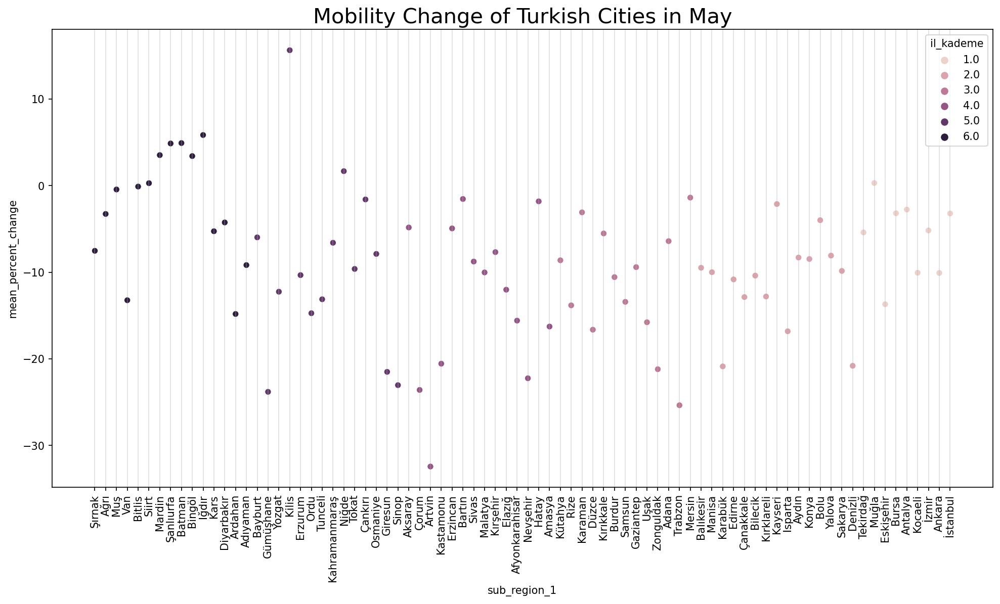

In [197]:
plt.figure(figsize=(16,8),dpi=150)

sns.scatterplot(data=df_tr[df_tr["month"] == 5].groupby(["sub_region_1","il_kademe"]).mean().sort_values("il_skor"), 
                x="sub_region_1",y="mean_percent_change", hue="il_kademe")

plt.grid(axis="x", alpha=0.4)
plt.xticks(rotation=90)

plt.title("Mobility Change of Turkish Cities in May", fontsize=20);


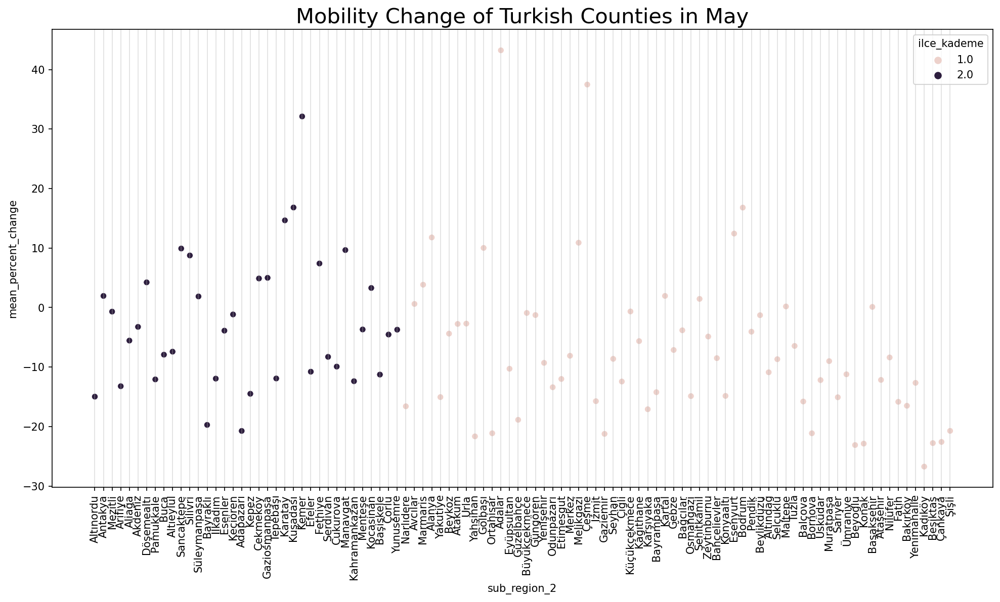

In [200]:
plt.figure(figsize=(16,8),dpi=150)

sns.scatterplot(data=df_tr[df_tr["month"] == 5].groupby(["sub_region_2","ilce_kademe"]).mean().sort_values("ilce_skor").iloc[-100:,:], 
                x="sub_region_2",y="mean_percent_change", hue="ilce_kademe")

plt.grid(axis="x", alpha=0.4)
plt.xticks(rotation=90)

plt.title("Mobility Change of Turkish Counties in May", fontsize=20);


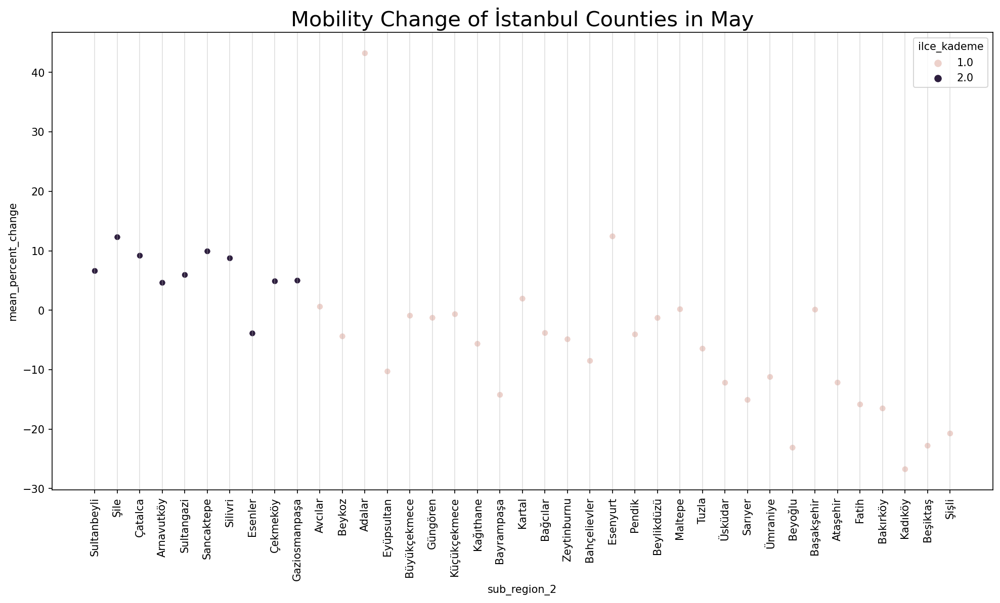

In [201]:
plt.figure(figsize=(16,8),dpi=150)

sns.scatterplot(data=df_tr[(df_tr["month"] == 5)&(df_tr["sub_region_1"] == "İstanbul")].groupby(["sub_region_2","ilce_kademe"]).mean().sort_values("ilce_skor").iloc[-100:,:], 
                x="sub_region_2",y="mean_percent_change", hue="ilce_kademe")

plt.grid(axis="x", alpha=0.4)
plt.xticks(rotation=90)

plt.title("Mobility Change of İstanbul Counties in May", fontsize=20);


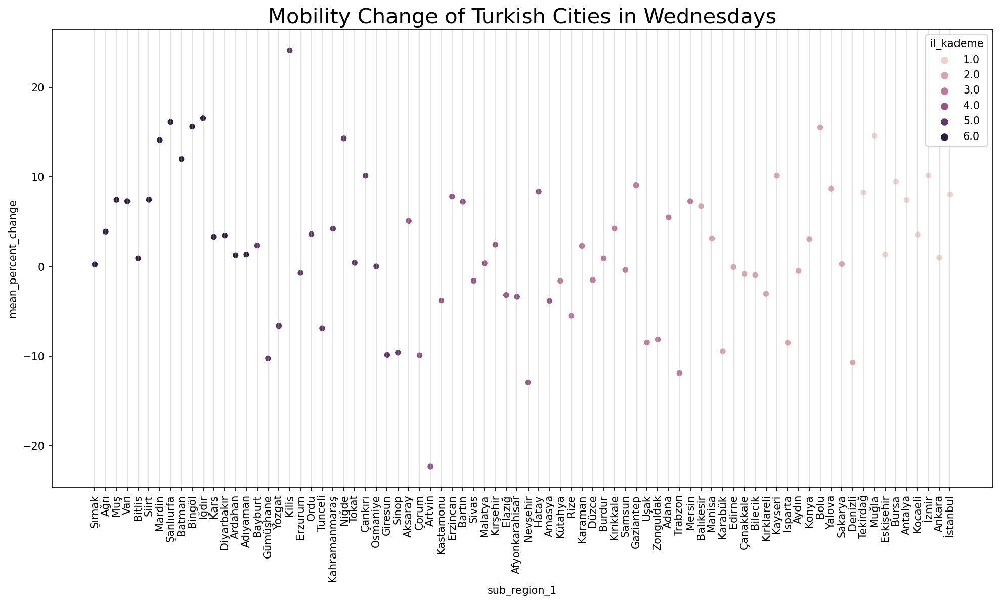

In [202]:
plt.figure(figsize=(16,8),dpi=150)

sns.scatterplot(data=df_tr[df_tr["weekday"] == 2].groupby(["sub_region_1","il_kademe"]).mean().sort_values("il_skor"), 
                x="sub_region_1",y="mean_percent_change", hue="il_kademe")

plt.grid(axis="x", alpha=0.4)
plt.xticks(rotation=90)

plt.title("Mobility Change of Turkish Cities in Wednesdays", fontsize=20);


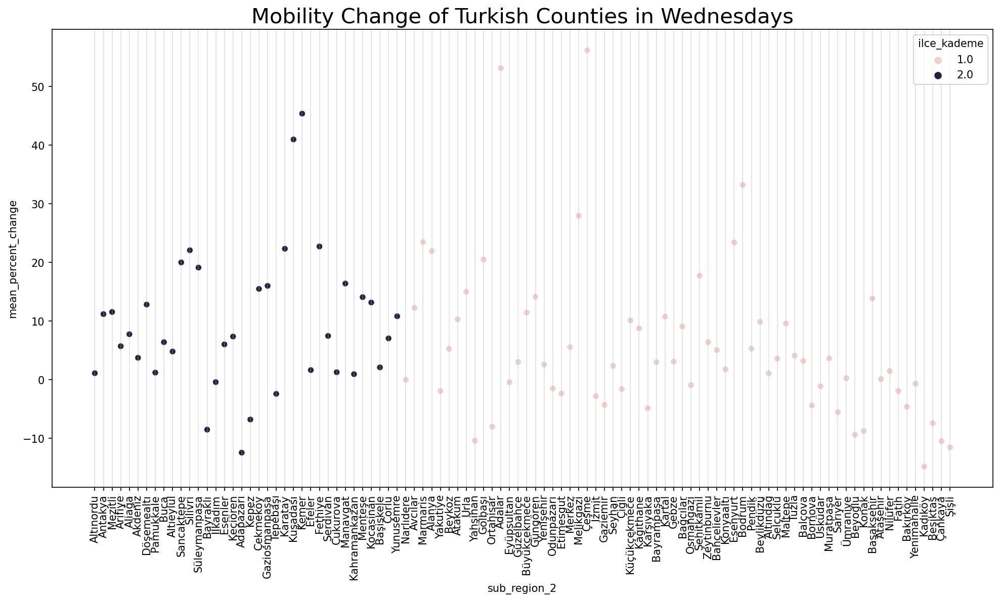

In [203]:
plt.figure(figsize=(16,8),dpi=150)

sns.scatterplot(data=df_tr[df_tr["weekday"] == 2].groupby(["sub_region_2","ilce_kademe"]).mean().sort_values("ilce_skor").iloc[-100:,:], 
                x="sub_region_2",y="mean_percent_change", hue="ilce_kademe")

plt.grid(axis="x", alpha=0.4)
plt.xticks(rotation=90)

plt.title("Mobility Change of Turkish Counties in Wednesdays", fontsize=20);


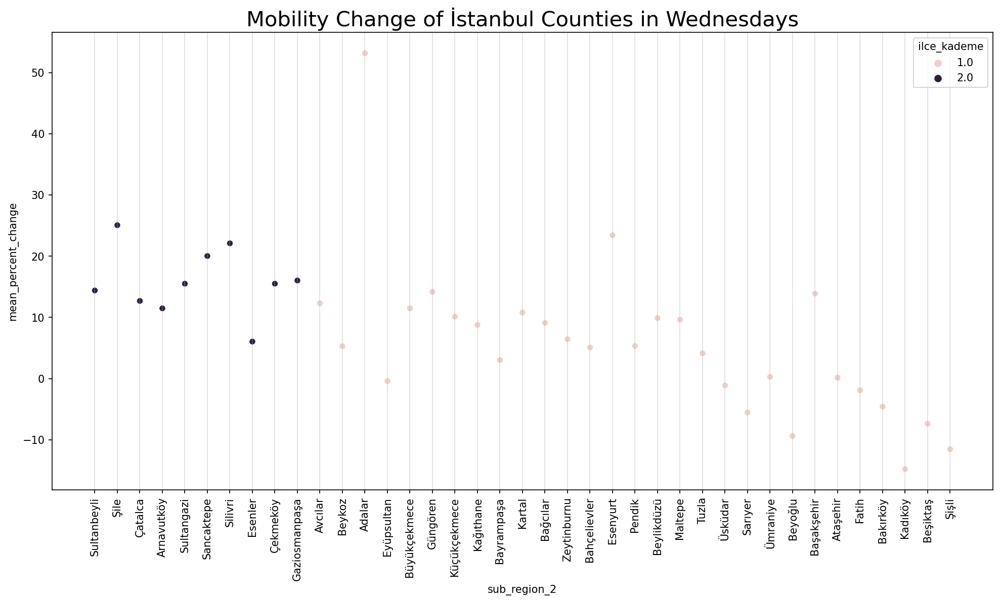

In [205]:
plt.figure(figsize=(16,8),dpi=150)

sns.scatterplot(data=df_tr[(df_tr["weekday"] == 2)&(df_tr["sub_region_1"] == "İstanbul")].groupby(["sub_region_2","ilce_kademe"]).mean().sort_values("ilce_skor").iloc[-100:,:], 
                x="sub_region_2",y="mean_percent_change", hue="ilce_kademe")

plt.grid(axis="x", alpha=0.4)
plt.xticks(rotation=90)

plt.title("Mobility Change of İstanbul Counties in Wednesdays", fontsize=20);


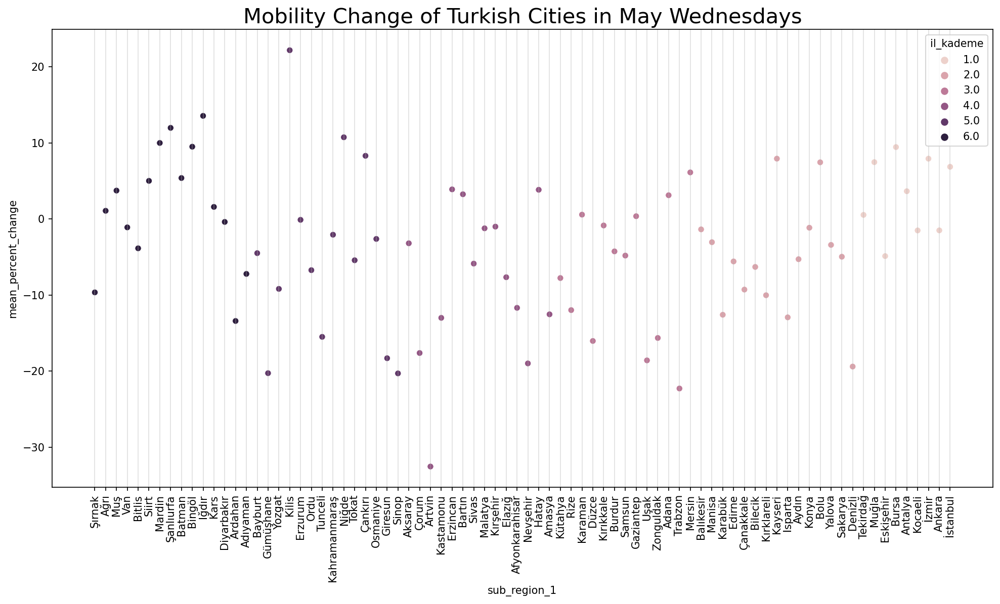

In [206]:
plt.figure(figsize=(16,8),dpi=150)

sns.scatterplot(data=df_tr[(df_tr["weekday"] == 2)&(df_tr["month"] == 5)].groupby(["sub_region_1","il_kademe"]).mean().sort_values("il_skor"), 
                x="sub_region_1",y="mean_percent_change", hue="il_kademe")

plt.grid(axis="x", alpha=0.4)
plt.xticks(rotation=90)

plt.title("Mobility Change of Turkish Cities in May Wednesdays", fontsize=20);


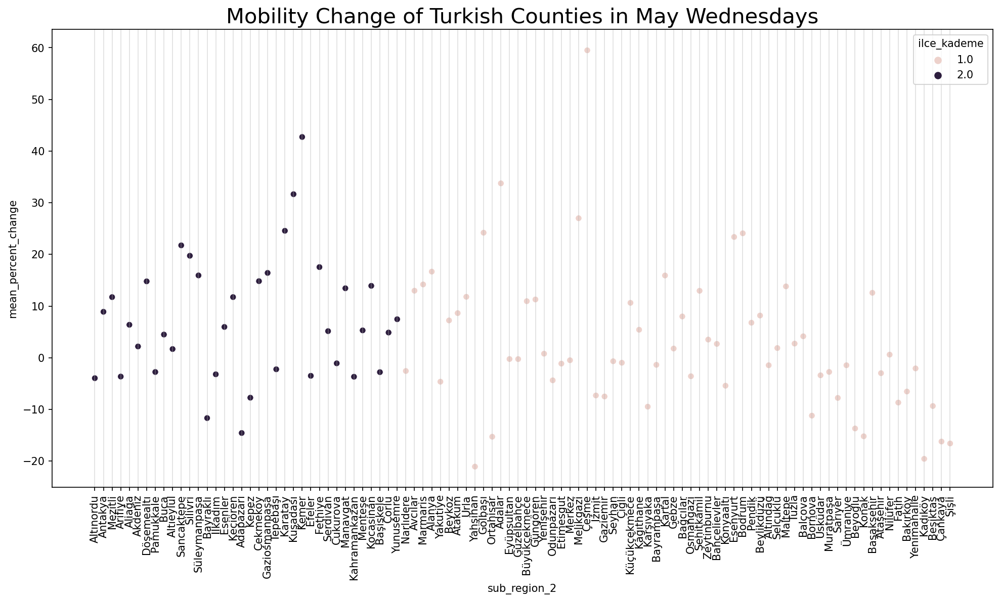

In [207]:
plt.figure(figsize=(16,8),dpi=150)

sns.scatterplot(data=df_tr[(df_tr["weekday"] == 2)&(df_tr["month"] == 5)].groupby(["sub_region_2","ilce_kademe"]).mean().sort_values("ilce_skor").iloc[-100:,:], 
                x="sub_region_2",y="mean_percent_change", hue="ilce_kademe")

plt.grid(axis="x", alpha=0.4)
plt.xticks(rotation=90)

plt.title("Mobility Change of Turkish Counties in May Wednesdays", fontsize=20);


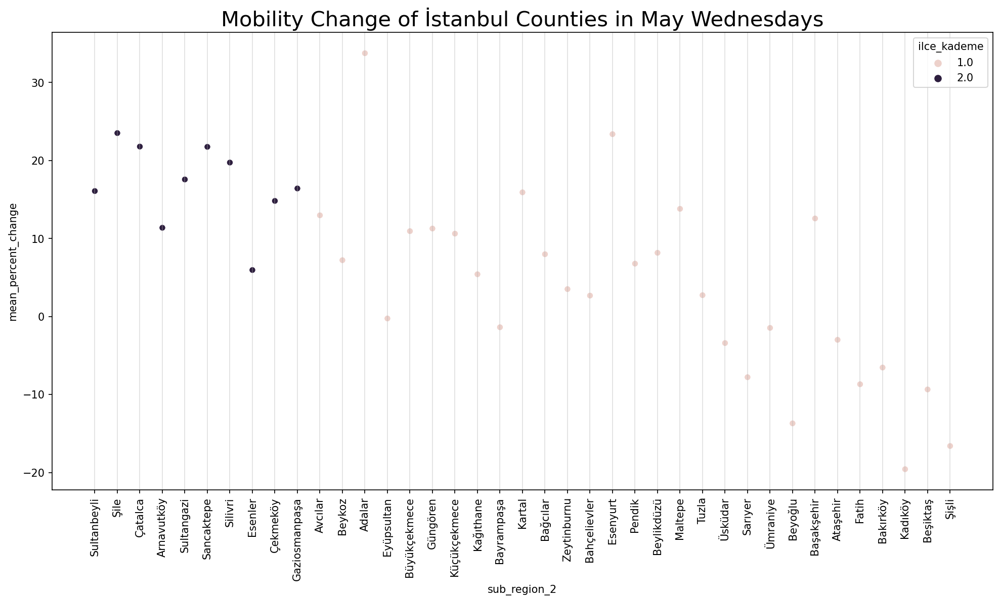

In [208]:
plt.figure(figsize=(16,8),dpi=150)

sns.scatterplot(data=df_tr[(df_tr["weekday"] == 2)&(df_tr["month"] == 5)&(df_tr["sub_region_1"] == "İstanbul")].groupby(["sub_region_2","ilce_kademe"]).mean().sort_values("ilce_skor").iloc[-100:,:], 
                x="sub_region_2",y="mean_percent_change", hue="ilce_kademe")

plt.grid(axis="x", alpha=0.4)
plt.xticks(rotation=90)

plt.title("Mobility Change of İstanbul Counties in May Wednesdays", fontsize=20);


As seen from the figures, even when we filter May and Wednesdays, there is no correlation between development and mobility change.

<br><br><br>

#### 3.7. Fuel Prices

Fuel prices supposed to be negatively correlated mobility change. To check this hypothesis, the fuel prices of Turkey is imported, since there is dramatic change in the fuel prices in Turkey.

The data collection process is explained in another work in this repository. Check out https://github.com/DrFarukAydin/data-science-portfolio/blob/main/data-collection-merging-and-cleaning/mobility-dataframe-preparation.ipynb

<b>Note: </b> 'Kursunsuz Benzin' refers to the fuel price.

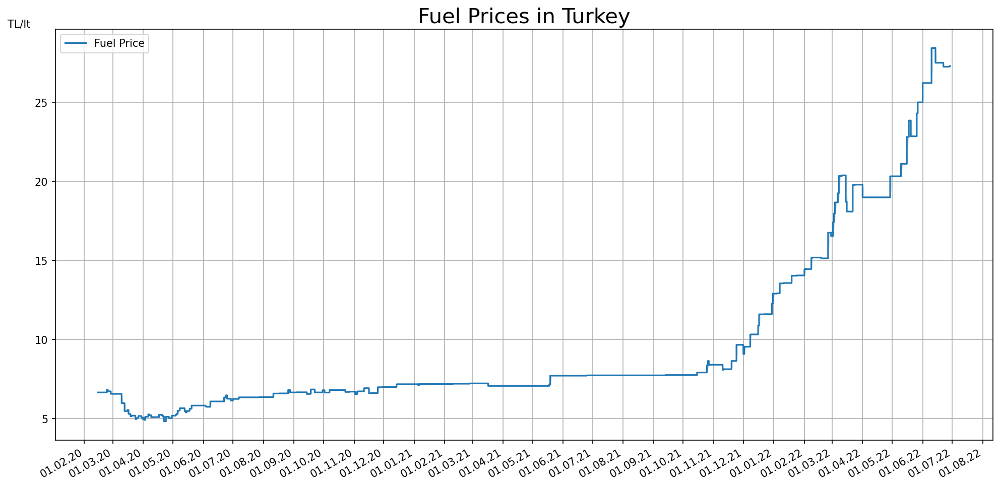

In [210]:
fig, ax = plt.subplots(figsize=(16,8),dpi=150)
l1 = sns.lineplot(data=df_tr, x= "date", y="Kurşunsuz Benzin", label="Fuel Price", drawstyle='steps-pre')

plt.ylabel("TL/lt",loc = "top", rotation=0)
plt.xlabel("")
myFmt = mdates.DateFormatter("%d.%m.%y")
ax.xaxis.set_major_formatter(myFmt)
ax.xaxis.set_major_locator(mdates.MonthLocator())
plt.grid()

## Rotate date labels automatically
fig.autofmt_xdate()
plt.title("Fuel Prices in Turkey", fontsize=20)
plt.legend();

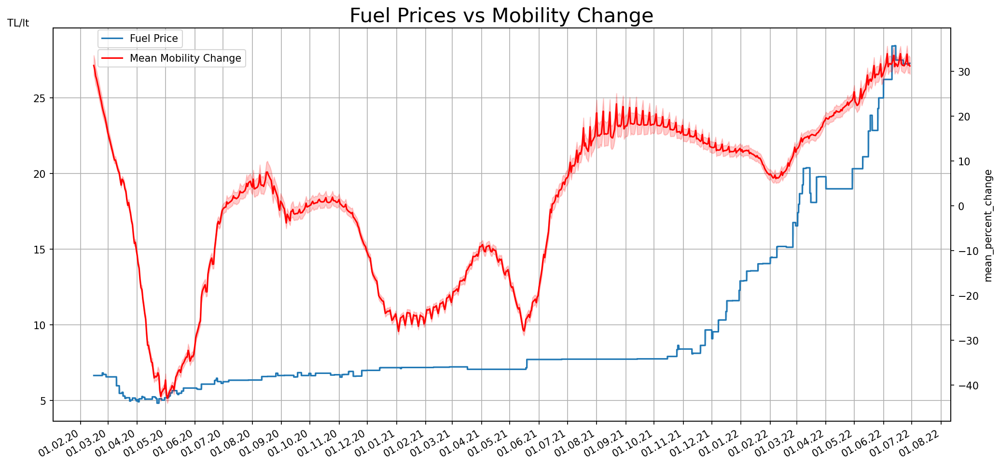

In [213]:
fig, ax = plt.subplots(figsize=(16,8),dpi=150)
l1 = sns.lineplot(data=df_tr, x= "date", y="Kurşunsuz Benzin", label="Fuel Price", drawstyle='steps-pre')

plt.ylabel("TL/lt",loc = "top", rotation=0)
plt.xlabel("")
myFmt = mdates.DateFormatter("%d.%m.%y")
ax.xaxis.set_major_formatter(myFmt)
ax.xaxis.set_major_locator(mdates.MonthLocator())
plt.grid()
plt.legend(loc=[0.05,0.95])

ax2=plt.twinx()
sns.lineplot(data=df_tr, x="date", y=df_tr["mean_percent_change"].rolling( 30).mean(), 
             label="Mean Mobility Change", ax=ax2, color="r")

## Rotate date labels automatically
fig.autofmt_xdate()
plt.title("Fuel Prices vs Mobility Change", fontsize=20)
plt.legend(loc=[0.05,0.9]);

As seen in the figure, even when the fuel price increase the mobility may also increase. Thus, we can conclude that fuel price does not play a significant role in mobility behaviour.

<br><br><br>

### 4. Conclusion and Discussion

In this work, the mobility change data during COVID19 pandemy provided by Google is visualized and analyzed after implementing further data such as GDP per capita, traffic congestion, development index, COVID19 case records, weather and fuel prices from various sources.

<ul>
<li>The first insight from the graphs indicates that the mobility decreased significantly in 2020 and 2021, whereas it increased in 2022 compared to the time interval before the pandemy.</li>
<li><strong>The seasons</strong> plays an important role in mobility, but it is hard to analyze the effect of <strong>the precipitation</strong> investigating only the graphs.</li>
<li>The governments published <strong>COVID19 Records</strong> and warn their citizens to avoid unnecessary mobility, however, the graphs shows that the number of cases have almost no correlation with the mobility change.</li>
<li><strong>The average traffic congestion</strong> is highly correlated the mobility change, but maximum and minimum traffic congestion values are not affected by the mobility change.</li>
<li><strong>The wealth indicators</strong>, such as GDP per capita and city development index, has no effects on the mobility.</li>
<li>It is expected that the increasing <strong>fuel prices</strong> would decrease the mobility changes, however, the mobility does not affected from the fuel prices.</li>
</ul>

Further studies can be conducted focusing on other locations in the world. Further data from other sources may conduct this research as well. This study is to gain an insight of the data only. 

To understand the statistical significance of the relationships of the variables statistical tests, such as ANOVA tests, should be conducted. Some statistical tests are already conducted in frame of this study. A link will be added as soon as the file is uploaded.

Machine Learning methods like regression and clustering may be conducted to investigate further. Some ML studies are conducted and will be uploaded to this repository.

The same dataframe is visualized with Tableau. You can check that from the following link: https://github.com/DrFarukAydin/data-science-portfolio/blob/main/data-visualization-tableau/data-visualization-tableau.ipynb